# New York City Month Ahead EV Charger Utilization Prediction



## Abstract 

In order to asist utilities and municipilaties in locating EV chargers efficiently, a complete machine learning solution is suggested. Energy Consumption in kWh is chosen as an indicator of the EV Charger utilization and several machine learning models are evaluated in their performance of predicting month ahead energy consumption per EV Charger. Unfortunately, the best peforming model resulted with an rmse of 142 kwh, which corresponds 42% of the mean energy consumption of the new york city ev chargers despite the effort. This notebook is a walkthrough of the steps I took to improve the model performance, what went wrong and the contribution of the different attempts (feature engineering, feature elimination, parameter tuning) to the overall performance of the project. 

The parts of the project are as follows: 

1. Data Cleaning <br>
2. Exploratory Data Analysis <br>
3. Feature Engineering <br>
4. Prediction Models <br>
5. Result Interpretations <br>

Data Mining and Data Cleaning steps have been the most daunting parts of the project. New York State Electric Vehicle Rebate Database is the main source for the EV Charger Energy Consumption. Later on, EV Registrations, Demographics and Economic Indicator features are gathered from different sources. 

Exploratory Data Analysis is performed in conjunction with data mining and cleaning. This stage helped deciding which features to include and how to transform the existing features. This stage also illustrates the high variation in the target variable. Unfortunately, non of the feature data gathered was sufficient to explain that variation in the first sight. 

After completing the EDA and exhausting the data sources, I started with the model building part. Here I evaluated:
1. Linear Regression(Backward Eliminated Feature Selection, Recursive Feature Selection) 
2. Ridge Regression
3. Lasso Regression 
4. Random Forest
5. Bagging, Boosting
6. Adaptive Boosting
7. Gradient Boosting Methods

The lowest RMSE is reached with the Bagging method. Its comparison with the other model performances and prediction/test values can be found in the model evaluation part.   

## Project Background 


Electric Vehicles are increasing in popularity due to their capabilities in greening the transportation industry. This popularity, is being widely supported by governments. For example, a target of having over 20 million EVs on the roads by 2020 has been set by the U.S. Department of Energy [2]. Several others states are also implementing similar policies. Despite the extensive government support, EV adoption rates are not able to reach the initial goals.[1] Insuﬃcient charging infrastructure is a signiﬁcant factor that prevents larger penetration of EVs[4]. Insufficient charging infrastructure causes 'range anxiety' of the drivers which can be defined as the "worry of an electric car owner that the battery will run out of power before the destination or a suitable charging point is reached".

In order to help governments and public utilities in creating efficiently operating public charging networks, we tested several machine learning models that predicts energy consumption at different temporal and spatial resolutions. By, predicting the future energy consumption of the EV Chargers, we hope to detect the areas where consumption will be high and help planing futurue infrastructure decisions wisely. If the location choice of the additional charging infrastructures are done in an analytic manner, we hope to increase the utilization of these public charging resources. 

This project, particularly focuses on public charging networks for several reasons. First of all, we want to help overcoming range anxiety of the EV owners that have home charging stations but are worried to drive far distances. Secondly, we want to increase the EV adoption at densely urban areas where home charging is not as available. Thirdly, public chargers has potential to also in reducing the peak load on the grid. By providing this resources at accessible locations during working hours, we want to prevent overloading of the grid when EV drivers come back from their homes. Encouraging day-time charging has additional benefits. Availability of public chargers at convenient locations can motivate EV owners to shift their charging times to the beneficial times for the grid. Instead of charging at home, after work, users can charge their cars at variable hours during the day when renewable energy generation is high. In order to access this benefits brought by public charging and allocate invesment resources efficiently, it is important to predict the locations with the high EV charger demand. 

In this project, we used the data from 3 NY state utility companies to analyze the charging patterns in order to predict the future demand. The results of this anaylsis can be utilized in detecting locations where demand exceeds the capacity and can inform utilities and planners in deciding where to invest in an additional charger. 

## Project Objective 

1. "The purpose of this project is to train and evaluate machine learning models to predict monthly energy demand across the city of New York, using one month befores features drawn from the US Census and EValuate NY Databases."

The answer of this question gains importance especially in densely populated cities like New York City. In such places, where at home charging is not available due to how cities are organized, public charger avaliability is crucial in increasing EV adoption rates. In densely populated urban areas, where people live at apartments or high rised buildings, public chargers at work, parking lots and key street locations are citizens only option. However, this type of infrastructure requires extensive planning of governments and utility companies. EV Charger locations should be chosen optimally considering both todays and futures demand. In order to predict the future demand for energy at certain locations, it is important to answer this question. 



## Input Data Description

In [1]:
import math
import numpy as np
import pandas as pd
import os
import datetime
from matplotlib import pyplot as plt
import geopandas as gpd
from geopandas import GeoDataFrame
from shapely.geometry import Point, Polygon

import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

The data for this project was sourced from evaluate NYYSERDA(New York State Electric  database, US Census database, City of New York Database. The first database we used and the main motivation behind this project can be accessed at https://www.nyserda.ny.gov/Researchers-and-Policymakers/Electric-Vehicles/Tools. An interactive online version of the database is also available(https://atlaspolicy.com/rand/evaluateny/). Within the NYSERDA Database, we used EV Charging Station Data which initally included records from 2011 to 2019.

1. Structure: The data is stored as an excel and connected to an external SQL database. We had to access data by filtering the pivot tables within the excel. 
2. Granularity: The charger use data included daily charging sessions, energy consumption, charging time and total duration connected to the charger. Each data entry, represent daily aggregated activities by ZIP Code and Charging Network. There 3 main charging network companies namely, ChargePoint, EV Connect and GE.
3. Scope: The data belongs to New York State and includes records from 2011 to 2019. 
4. Temporality: Data is collected on a monthly basis. The records are as type datetime64. 


In [2]:
charginguse = pd.read_excel('EValuateNY-ZIP-File/resources.xlsx',sheet_name='Charging Use')
charginguse['ZIP Code'] = charginguse['ZIP Code'].astype(str)
print(charginguse.dtypes)

print('\n Dataset contains charging use records from ' +str(charginguse['Start Date'].min())+' to '+ str(charginguse['Start Date'].max()))

charginguse.head()



Start Date                datetime64[ns]
ZIP Code                          object
Network                           object
Charging Time (hours)              int64
Total Duration (hours)             int64
Energy (kWh)                     float64
Charging Sessions                  int64
Active Station Count               int64
Active Port Count                  int64
dtype: object

 Dataset contains charging use records from 2010-12-01 00:00:00 to 2019-09-01 00:00:00


,Start Date,ZIP Code,Network,Charging Time (hours),Total Duration (hours),Energy (kWh),Charging Sessions,Active Station Count,Active Port Count
0,2019-06-01,11030,ChargePoint Network,21,5,5870.918,477,4,8
1,2019-05-01,11030,ChargePoint Network,21,5,5372.274,430,4,8
2,2018-10-01,11030,ChargePoint Network,4,17,5358.338,462,4,8
3,2019-03-01,11030,ChargePoint Network,14,12,5179.635,408,4,8
4,2019-01-01,11030,ChargePoint Network,14,16,5021.285,377,4,8


In [3]:
incentives = pd.read_excel("EValuateNY-ZIP-File/resources.xlsx",sheet_name='EV Incentives')
ny_rebates = incentives[incentives['State']=='New York']
ny_rebates = ny_rebates[['Law ID','Incentive Category','Enacted Date','Expiration Date']].drop_duplicates().reset_index()
ny_rebates.head()

,index,Law ID,Incentive Category,Enacted Date,Expiration Date
0,41,11689,Rebate,2017-04-01,NaT
1,56,11897,Municipal Rebate,2016-04-01,2019-07-26
2,57,11897,Municipal Rebate,2016-04-01,2019-07-29


In [4]:
zipcode_data = pd.read_excel("EValuateNY-ZIP-File/resources.xlsx",sheet_name='ZIP Code')
zipcode_clean = zipcode_data[['ZIP Code','Type', 'Primary City', 'State Abbreviation', 'Latitude',
       'Longitude', 'Area Land Sq Miles', 'County', 'County GEOID', 'Census Bureau Division','Classification','Urban Area Name']]
zipcode_clean['ZIP Code'] = zipcode_clean['ZIP Code'].astype(str)
zipcode_clean['Primary City'] = zipcode_clean['Primary City'].astype(str)
zipcode_clean['County'] = zipcode_clean['County'].astype(str)
zipcode_clean.head()


,ZIP Code,Type,Primary City,State Abbreviation,Latitude,Longitude,Area Land Sq Miles,County,County GEOID,Census Bureau Division,Classification,Urban Area Name
0,00501,UNIQUE,Holtsville,NY,40.81,-73.04,NaN,Suffolk County,36103,Mid-Atlantic,Very Urban,Unknown
1,00544,UNIQUE,Holtsville,NY,40.81,-73.04,NaN,Suffolk County,36103,Mid-Atlantic,Very Urban,Unknown
2,06390,PO BOX,Fishers Island,NY,41.27,-71.99,10555961.0,Suffolk County,36103,Mid-Atlantic,Very Urban,Not in a 2010 urban area
3,13605,STANDARD,Adams,NY,43.80,-76.02,209099378.0,Jefferson County,36045,Mid-Atlantic,Urban,"Adams, NY Urban Cluster"
4,13606,STANDARD,Adams Center,NY,43.85,-75.99,91026778.0,Jefferson County,36045,Mid-Atlantic,Urban,"Adams, NY Urban Cluster"


In [5]:
registration_data = pd.read_excel('EValuateNY-ZIP-File/ny_ev_registrations.xlsx',sheet_name='EV Registrations')

In [6]:
registration_data['ZIP Code'] = registration_data['ZIP Code'].astype('category')
print(registration_data.dtypes)
print('Dataset contains registrations records from ' +str(registration_data['Registration Valid Date'].min())+' to '+ str(registration_data['Registration Valid Date'].max()))

print('Dataset contains expiration dates from ' +str(registration_data['Registration Expiration Date'].min())+' to '+ str(registration_data['Registration Expiration Date'].max()))

registration_data=registration_data.sort_values(by='Registration Valid Date', na_position='first').reset_index(drop=True)

VIN                                     object
ZIP Code                              category
Registration Valid Date         datetime64[ns]
VIN Prefix                              object
DMV ID                                   int64
VIN Model Year                          object
Registration Expiration Date    datetime64[ns]
dtype: object
Dataset contains registrations records from 2011-01-01 00:00:00 to 2019-11-01 00:00:00
Dataset contains expiration dates from 2017-07-05 00:00:00 to 2022-01-31 00:00:00


In [7]:
registration_data.loc[:,'duration'] = registration_data.loc[:,'Registration Expiration Date']-registration_data.loc[:,'Registration Valid Date']  
registration_data.head()

,VIN,ZIP Code,Registration Valid Date,VIN Prefix,DMV ID,VIN Model Year,Registration Expiration Date,duration
0,5ASAG27402F019471,12946,2011-01-01,5ASAG274,1,2,NaT,NaT
1,5ASAG27422F018578,14202,2011-01-01,5ASAG274,1,2,NaT,NaT
2,5ASAG27442F022728,14202,2011-01-01,5ASAG274,1,2,NaT,NaT
3,5ASAG274X2F019476,14202,2011-01-01,5ASAG274,1,2,NaT,NaT
4,5ASAG27492F024166,14202,2011-01-01,5ASAG274,1,2,NaT,NaT


NY State is the only state publishing the vehicle registrations. EValuateNY database that we used to find the charging use data extracted the ev registrations from the original motor vehicle registrations file. The original vehicle,boat and snowboat registration database can be accessed through ny departmemnt of motor vehicles. (https://data.ny.gov/Transportation/Vehicle-Snowmobile-and-Boat-Registrations/w4pv-hbkt/data).

Finally, we found census (population) and demographic data (e.g. Travel times to work, education status) around New York State. Some of the census and demographic data were available on the NYSERDA database. However, more recent census and demographic data were not available on the database. In this case, we went to the US Census web site(https://data.census.gov/cedsci/) and supplemented data from there. We filtered our choice of variables based on ZIP Codes and downloaded the associated CSV files. 

The granularity of the data is by zip code and each data were collected annually.

In [8]:
# Travel Times
agg_tr_2015=pd.read_csv('Aggregate Travel Time to Work 2015.csv',header =1)
agg_tr_2016=pd.read_csv('Aggregate Travel Time to Work 2016.csv',header =1)
agg_tr_2017=pd.read_csv('Aggregate Travel Time to Work 2017.csv',header =1)

# Means of transportation to work

means_tr_2015=pd.read_csv('Means of Transportation to Work 2015 .csv',header =1)
means_tr_2016=pd.read_csv('Means of Transportation to Work 2016.csv',header =1)
means_tr_2017=pd.read_csv('Means of Transportation to Work 2017.csv',header =1)

# Median income
med_inc_2015=pd.read_csv('Median Income in Past 12 Months 2015.csv',header =1)
med_inc_2016=pd.read_csv('Median Income in Past 12 Months 2016.csv',header =1)
med_inc_2017=pd.read_csv('Median Income in Past 12 Months 2017.csv',header =1)
Education_15 = pd.read_csv("Edu_15.csv")

Sex_15 = pd.read_csv("SEX_AGE_15.csv")

Race_15 = pd.read_csv("Race_15.csv")


In [9]:
#Economics activity related data is sourced from policy map. 
file_list = []

for i,path in enumerate(os.listdir('Policy Map Data')):
    path = 'Policy Map Data/'+path
    df = pd.read_csv(path)
    file_list.append(df)

files = pd.concat(file_list, axis=1)

files.tail(10)
files = files.iloc[:211,:]
files = files.drop(['FIPS Code','Formatted FIPS'],axis=1)
files.isnull().sum()

Zip Code Tabulation Area                                          0
Number of non-federal jobs in all industries in 2017.             0
Zip Code Tabulation Area                                          0
Number of non-federal jobs in all industries in 2014.             0
Zip Code Tabulation Area                                          0
Number of non-federal jobs in all industries in 2016.             0
Zip Code Tabulation Area                                          0
Number of jobs at firms with 500 or more employees in 2016.       0
Zip Code Tabulation Area                                          0
Number of jobs at firms with 500 or more employees in 2017.       0
Zip Code Tabulation Area                                          0
Number of jobs at firms with 500 or more employees in 2015.       1
Zip Code Tabulation Area                                          0
Number of jobs at firms with fewer than 500 employees in 2017.    0
Zip Code Tabulation Area                        

## Data Cleaning

In this section we merged, 21 Datasets that we will use for our predictions. 

In [10]:
year_17 = [2017] * 211
year_16 = [2016] * 211
year_15 = [2015] * 211
year_14 = [2014] * 211


data17 =pd.DataFrame(data= {'ZIP Code': list(files.iloc[:,0]),'Year':year_17})
data16 = pd.DataFrame(data= {'ZIP Code': list(files.iloc[:,0]),'Year':year_16})
data15 = pd.DataFrame(data= {'ZIP Code': list(files.iloc[:,0]),'Year':year_15})
data14 = pd.DataFrame(data= {'ZIP Code': list(files.iloc[:,0]),'Year':year_14})
files.columns.unique()
#data14['Percent of jobs at firms with 500 or more employees'] = pd.Series()
data14['Number of jobs at firms with 500 or more employees'] = pd.Series()
#data17['Percent of jobs at firms with 500 or more employees'] = pd.Series()
data15['Number of jobs at firms with fewer than 500 employees'] = pd.Series()
#data17['Percent of jobs at firms with 500 or more employees'] = files['Percent of jobs at firms with 500 or more employees in 2017.']
##data14['Percent of jobs at firms with 500 or more employees'] = files['Percent of jobs at firms with 500 or more employees in 2014.']
data15['Number of jobs at firms with fewer than 500 employees'] = files['Number of jobs at firms with fewer than 500 employees in 2015.']
data14['Number of jobs at firms with 500 or more employees'] = files['Number of jobs at firms with 500 or more employees in 2014.']

for col in files.columns.unique():
    if('2017' in col):
        data17[col.replace(' in 2017.','')] = files[col]
    elif('2016' in col):
        
        data16[col.replace(' in 2016.','')] = files[col]

    elif('2015' in col):
        data15[col.replace(' in 2015.','')] = files[col]
        
    elif('2014' in col):

        data14[col.replace(' in 2014.','')] = files[col]
        
employment = pd.concat([data17,data16,data15],sort=True)

employment = employment.reset_index(drop=True)

In [11]:
# Charging Use Cleaning 

charginguse["ZIP Code"]=charginguse["ZIP Code"].astype(str) 
merged_df = pd.merge(charginguse , zipcode_clean,how='left' ,on = 'ZIP Code')

#Charging Use Aggregated 

##Agregating Data by Network 
charginguse["ZIP Code"]=charginguse["ZIP Code"].astype(str) 
charginguse_aggregated = charginguse.groupby(['ZIP Code','Start Date'],as_index=False).sum()
charginguse_aggregated
print("ZIP Codes with charging data: " +str(len(charginguse['ZIP Code'].unique())), " \nTotal zipcode: " + str(len(zipcode_clean['ZIP Code'].unique())))



ZIP Codes with charging data: 125  
Total zipcode: 2209


#### Demographic data cleaning of education, sex and race

In [12]:
# Data Cleaning - This part is done by Yuwei Quan.

#helper functions
def reset_head(df):
  head = df.iloc[0]
  df = df.iloc[1:]
  df.columns = head
  return df
  # Now streamline the process
def Education_cleaning(Education_15):
  Education_15 = Education_15.loc[:,((Education_15.columns.str.contains("EST")) | (Education_15.columns.str.contains("GEO")))]
  Education_15 = Education_15.loc[:,(Education_15.iloc[0].str.contains("Total") |Education_15.iloc[0].str.contains("Geography") )]
  Education_15 = reset_head(Education_15)
  #feature_matrix = pd.DataFrame()
  population_15_test = Education_15[["Geography",'Total; Estimate; Population 18 to 24 years', 'Total; Estimate; Population 25 years and over','Total; Estimate; Population 65 years and over']]
  population_15 = population_15_test.loc[:,["Geography"]]
  population = population_15_test['Total; Estimate; Population 18 to 24 years'].astype(int) + population_15_test['Total; Estimate; Population 25 years and over'].astype(int)
  population_15["population"] = population
  #population_15
  less_9th_15 = Education_15.loc[:,["Geography",'Total; Estimate; Population 25 years and over - Less than 9th grade']]
  feature_matric = pd.merge(population_15,less_9th_15, on = "Geography")
  nine_to_twlve_15 = Education_15.loc[:,["Geography",'Total; Estimate; Population 25 years and over - 9th to 12th grade, no diploma']]
  feature_matric = pd.merge(feature_matric, nine_to_twlve_15, on = "Geography")
  High_school_test = Education_15.loc[:,["Geography","Total; Estimate; Population 18 to 24 years - High school graduate (includes equivalency)",'Total; Estimate; Population 25 years and over - High school graduate (includes equivalency)']]
  High_school_15 = pd.DataFrame()
  High_school_15["Geography"] = High_school_test.loc[:, "Geography"]
  High_school_15["High school"] = High_school_test["Total; Estimate; Population 18 to 24 years - High school graduate (includes equivalency)"].astype(int) + High_school_test['Total; Estimate; Population 25 years and over - High school graduate (includes equivalency)'].astype(int)
  feature_matric = pd.merge(feature_matric,High_school_15, on = "Geography")
  college_associate_test = Education_15.loc[:,["Geography","Total; Estimate; Population 18 to 24 years - Some college or associate's degree", 'Total; Estimate; Population 25 years and over - Some college, no degree', "Total; Estimate; Population 25 years and over - Associate's degree"]]
  college_associate_15 = pd.DataFrame()
  college_associate_15["Geography"] = college_associate_test["Geography"]
  college_associate_15["College and Associate"] = college_associate_test["Total; Estimate; Population 18 to 24 years - Some college or associate's degree"].astype(int) +  college_associate_test['Total; Estimate; Population 25 years and over - Some college, no degree'].astype(int)+ college_associate_test["Total; Estimate; Population 25 years and over - Associate's degree"].astype(int)
  feature_matric = pd.merge(feature_matric,college_associate_15, on = "Geography")
  Bachelor_above_15 = Education_15.loc[:,["Geography"]]
  Bachelor_above_15["Bachelor_+above"] = Education_15["Total; Estimate; Population 18 to 24 years - Bachelor's degree or higher"].astype(int)+Education_15["Total; Estimate; Population 25 years and over - Bachelor's degree"].astype(int)+Education_15['Total; Estimate; Population 25 years and over - Graduate or professional degree'].astype(int)
  feature_matric = pd.merge(feature_matric,Bachelor_above_15, on = "Geography")
  return feature_matric
def sex_cleaning(Sex_15):
  Sex_15 = reset_head(Sex_15)
  Sex_15 = Sex_15.loc[:, ["Geography", "Male; Estimate; Total population","Female; Estimate; Total population"]]
  return Sex_15
def race_cleaning(Race_15):
  Race_15 = reset_head(Race_15)
  Race_15 = Race_15.loc[:,["Geography",'Estimate; Total: - White alone','Estimate; Total: - Black or African American alone','Estimate; Total: - American Indian and Alaska Native alone','Estimate; Total: - Asian alone','Estimate; Total: - Native Hawaiian and Other Pacific Islander alone','Estimate; Total: - Some other race alone']]
  return Race_15
def merge_to_feature(sex, edu, race):
  feature_15 = pd.merge(edu, sex, on = "Geography")
  feature_15 = pd.merge(feature_15, race, on = "Geography")
  return feature_15

Edu_15 = Education_cleaning(Education_15)

Education_16 = pd.read_csv("EDU_16.csv")
Edu_16 = Education_cleaning(Education_16)

Education_17 = pd.read_csv("EDU_17.csv")
Edu_17 = Education_cleaning(Education_17)

Sex_15 = sex_cleaning(Sex_15)

Sex_16 = pd.read_csv("SEX_AGE_16.csv")
Sex_16 = sex_cleaning(Sex_16)

Sex_17 = pd.read_csv("SEX_AGE_17.csv")
Sex_17 = sex_cleaning(Sex_17)

Race_15 = race_cleaning(Race_15)

Race_16 = pd.read_csv("RACE_16.csv")
Race_16 = race_cleaning(Race_16)

Race_17 = pd.read_csv("RACE_17.csv")
Race_17 = race_cleaning(Race_17)


feature_15 = merge_to_feature(Sex_15, Edu_15, Race_15)
feature_16 = merge_to_feature(Sex_16, Edu_16, Race_16)
feature_17 = merge_to_feature(Sex_17, Edu_17, Race_17)

for i in range(len(feature_15)):
  if feature_15.loc[i,"Geography"] != 'New York':
        feature_15.loc[i,'ZIP Code'] = feature_15.loc[i,"Geography"][-5:]
        feature_15.loc[i,"Year"] = pd.to_datetime('2015', format='%Y').year
    
feature_15 =feature_15.drop(labels = ['Geography'],axis=1)

feature_16 = merge_to_feature(Sex_16, Edu_16, Race_16)
for i in range(len(feature_16)):
  feature_16.loc[i,"Year"] = pd.to_datetime('2016', format='%Y').year
  if feature_16.loc[i,"Geography"] != 'New York':
        feature_16.loc[i,'ZIP Code'] = feature_16.loc[i,"Geography"][-5:]
   
feature_16 = feature_16.drop(labels = ['Geography'],axis=1)

feature_17 = merge_to_feature(Sex_17, Edu_17, Race_17)
for i in range(len(feature_17)):
  feature_17.loc[i,"Year"] = pd.to_datetime('2017', format='%Y').year
  if feature_17.loc[i,"Geography"] != 'New York':
        feature_17.loc[i,'ZIP Code'] = feature_17.loc[i,"Geography"][-5:]
    
feature_17 = feature_17.drop(labels = ['Geography'],axis=1)

features = pd.concat([feature_15,feature_16,feature_17],sort=False)
features.head()

,population,Total; Estimate; Population 25 years and over - Less than 9th grade,"Total; Estimate; Population 25 years and over - 9th to 12th grade, no diploma",High school,College and Associate,Bachelor_+above,Male; Estimate; Total population,Female; Estimate; Total population,Estimate; Total: - White alone,Estimate; Total: - Black or African American alone,Estimate; Total: - American Indian and Alaska Native alone,Estimate; Total: - Asian alone,Estimate; Total: - Native Hawaiian and Other Pacific Islander alone,Estimate; Total: - Some other race alone,ZIP Code,Year
0,15421400,894391,1035726,4098369,4244755,4890411,9541801,10131373,12704637,3070392,74793,1570223,6485,1685765,NaN,NaN
1,292,2,11,86,52,141,187,152,331,0,0,0,0,0,06390,2015.0
2,20613,736,623,3092,3406,12709,11827,11710,14180,2869,36,4519,0,1050,10001,2015.0
3,68521,13276,6464,14298,11938,21828,38814,41922,23866,6952,177,34908,6,11978,10002,2015.0
4,53249,721,599,5019,11899,34845,27187,29925,44339,2490,95,7738,0,802,10003,2015.0


#### Demographic data cleaning of travel time and income

In [13]:
def merge_files(file_list):
    merged_df=file_list[0][['Id', 'Id2', 'Geography']]
    for i in range(len(file_list)):
        merged_df=pd.merge(merged_df,file_list[i],how='outer',on=['Id', 'Id2', 'Geography'])
    return(merged_df)

filelist_15 = [agg_tr_2015,means_tr_2015,med_inc_2015]
filelist_16 = [agg_tr_2016,means_tr_2016,med_inc_2016]
filelist_17 = [agg_tr_2017,means_tr_2017,med_inc_2017]

demographics_15 = merge_files(filelist_15)
demographics_16 = merge_files(filelist_16)
demographics_17 = merge_files(filelist_17)

def add_zip_year(demographics,year):
    demographics=demographics.rename(columns={"Id2": "ZIP Code",'Id':'Year'})
    for i in range(len(demographics)):
        if demographics.loc[i,"Geography"] != 'United States':
            demographics.loc[i,"Year"] = pd.to_datetime(str(year), format='%Y').year
            demographics.loc[i,'ZIP Code'] = demographics.loc[i,"Geography"][-5:]
    
    return demographics

demographics_15 = add_zip_year(demographics_15,2015)
demographics_16 = add_zip_year(demographics_16,2016)
demographics_17 = add_zip_year(demographics_17,2017)

demographics = pd.concat([demographics_15,demographics_16,demographics_17],sort=False)
demographics.head()


,Year,ZIP Code,Geography,Estimate; Aggregate travel time to work (in minutes):,"Estimate; Total: - Car, truck, or van - drove alone:","Estimate; Total: - Car, truck, or van - carpooled:",Estimate; Total: - Public transportation (excluding taxicab):,Estimate; Total: - Walked:,Estimate; Total: - Worked at home:,Median income (dollars); Estimate; Households
0,0100000US,NaN,United States,3559633065,109733354,13575283,7362038,3998629,6352737,53889
1,2015,10001,ZCTA5 10001,340515,395,221,5595,5277,772,86801
2,2015,10002,ZCTA5 10002,1048665,2231,1048,19002,9012,1679,33726
3,2015,10003,ZCTA5 10003,802060,1462,393,18754,8287,2583,98151
4,2015,10004,ZCTA5 10004,49225,173,18,1276,429,163,119691


### EV Registration Data Cleaning

In [14]:
from datetime import timedelta
delta = timedelta(days=registration_data['duration'].mean().days)

print('mean registration duration '+ str(registration_data['duration'].mean()))
nulls = registration_data[registration_data['Registration Expiration Date'].isnull()]
nulls['Registration Expiration Date'] = registration_data['Registration Valid Date'] + delta

registration_data_avg = pd.concat([nulls, registration_data[registration_data['Registration Expiration Date'].notnull()]], axis=0)
print("Type of Registration Expiration Date: "+str(type(registration_data_avg.loc[0,"Registration Expiration Date"])))
print("Type of Registration Expiration Valid: "+str(type(registration_data_avg.loc[0,"Registration Valid Date"])))
registration_data_avg.head()

mean registration duration 685 days 14:44:19.780074
Type of Registration Expiration Date: <class 'pandas._libs.tslibs.timestamps.Timestamp'>
Type of Registration Expiration Valid: <class 'pandas._libs.tslibs.timestamps.Timestamp'>


,VIN,ZIP Code,Registration Valid Date,VIN Prefix,DMV ID,VIN Model Year,Registration Expiration Date,duration
0,5ASAG27402F019471,12946,2011-01-01,5ASAG274,1,2,2012-11-16,NaT
1,5ASAG27422F018578,14202,2011-01-01,5ASAG274,1,2,2012-11-16,NaT
2,5ASAG27442F022728,14202,2011-01-01,5ASAG274,1,2,2012-11-16,NaT
3,5ASAG274X2F019476,14202,2011-01-01,5ASAG274,1,2,2012-11-16,NaT
4,5ASAG27492F024166,14202,2011-01-01,5ASAG274,1,2,2012-11-16,NaT


#### Get cumulative number of EVs from individual registrations

In [15]:
dates = []
for y in range(2013,2020):
    for m in range(1,13):
        dates.append(pd.Timestamp(year=y, month=m, day=1, hour=0))
cumulative_ev_registrations = pd.DataFrame(columns=['ZIP Code', 'Date', 'Registered EVs'])
registration_data_avg['ZIP Code'] = registration_data_avg['ZIP Code'].astype(str)

In [1257]:
# Getting cumulative number of EVs from individual registrations 
i = 0
for date in dates:
    for zipcode in zipcode_clean['ZIP Code'].unique():
        cumulative_ev_registrations.loc[i,'ZIP Code'] = zipcode
        cumulative_ev_registrations.loc[i,'Date'] = date
        mid_month = pd.Timestamp(year=date.year, month=date.month, day=15, hour=0)
        cumulative_ev_registrations.loc[i,'Registered EVs'] = len(registration_data_avg.loc[(registration_data_avg["Registration Valid Date"]<= date) & 
                                             (registration_data_avg["Registration Expiration Date"] > date) & (registration_data_avg["ZIP Code"]==zipcode)])
        i = i+1
#this loop here takes 6 hours to run. So instead I am going to write it to an excel file. and read from there.

In [16]:
# cumulative_ev_registrations=cumulative_ev_registrations[['Date', 'ZIP Code','Registered EVs']]
# cumulative_ev_registrations['Registered EVs'] = cumulative_ev_registrations1['Registered EVs'].astype(int)
# cumulative_ev_registrations['ZIP Code'] = cumulative_ev_registrations1['ZIP Code'].astype(str)
# #cumulative_ev_registrations.to_excel("cumulative_ev_registrations.xlsx") 
cumulative_ev_registrations = pd.read_excel("cumulative_ev_registrations.xlsx")
cumulative_ev_registrations['ZIP Code']=cumulative_ev_registrations['ZIP Code'].astype(str)
cumulative_ev_registrations.replace('Out of State',None)
cumulative_ev_registrations['Date']=pd.to_datetime(cumulative_ev_registrations['Date'])
cumulative_ev_registrations.head()

,Unnamed: 0,Date,ZIP Code,Registered EVs
0,0,2013-01-01,00501,0
1,1,2013-01-01,00544,0
2,2,2013-01-01,06390,0
3,3,2013-01-01,13605,6
4,4,2013-01-01,13606,2


## Data Summary and Exploratory Data Analysis


In [17]:
# visual libraries
from matplotlib import pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.gridspec as gridspec
plt.style.use('ggplot')

### 1.Charging Use EDA 



#### 1.1. Charger Locations within the State 

The initial dataset contains data from 3 public charger utilities, for the whole NY State. Belowe is a simple visualization of the locations of the chargers withing the state.  We can see that within the state borders the chargers are located at very dispersedly except the two concentrated areas. 


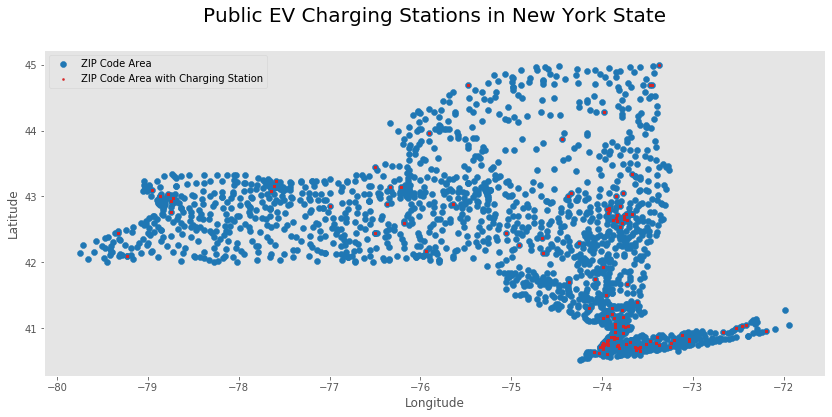

In [18]:
nyc = gpd.read_file("ZIP_CODE_040114/ZIP_CODE_040114.shp")
geo_df = pd.merge(charginguse, zipcode_clean,how='left' ,on = 'ZIP Code')
geo_df = gpd.GeoDataFrame(geo_df, geometry=gpd.points_from_xy(geo_df.Longitude, geo_df.Latitude))

plt.figure(figsize = (14,6))
plt.scatter(x = zipcode_clean.Longitude, y = zipcode_clean.Latitude, c ='tab:blue')
plt.scatter(x = geo_df.Longitude, y = geo_df.Latitude, c = 'tab:red',s = 4)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Public EV Charging Stations in New York State\n',size=20)
plt.legend(['ZIP Code Area','ZIP Code Area with Charging Station'])
plt.grid()

#### 1.2 Charge Use Indicators 

The charge use metrics presented in the data set were: <br>

**Charging Time:** Total time in hours that energy is delivered to the car <br>
**Total Duration:** The time passed starting from pluging-in to plugging-out. Should be equal or greater than the charging time <br>
**Energy (kWh):** Total Energy delivered within the month in kWh. <br>
**Charging Sessions:** Number of charging instances. <br>

An initial observation is that , the indicators are not normally distributed but it is almsot equally distributed. For the later two variables, the curve is skewed to left meaning there are many zero values. 

When we take a look at the values in the second plot area, we see that there is a decreasing trend in the indicator values after 2019. This can either mean, there is a drop in the charger usage which is non-realistic considering the popularity of EVs or there are some missing values. 

Further scrutiny by dividing the chargers by network indicates that, there are eactually periods of no data missing data for EV Connect Network. We can deal with the missing EV Connect data in two ways. Either, we can drop the whole EV Connect recordings or we can drop the months where EV Connect had missing data. 


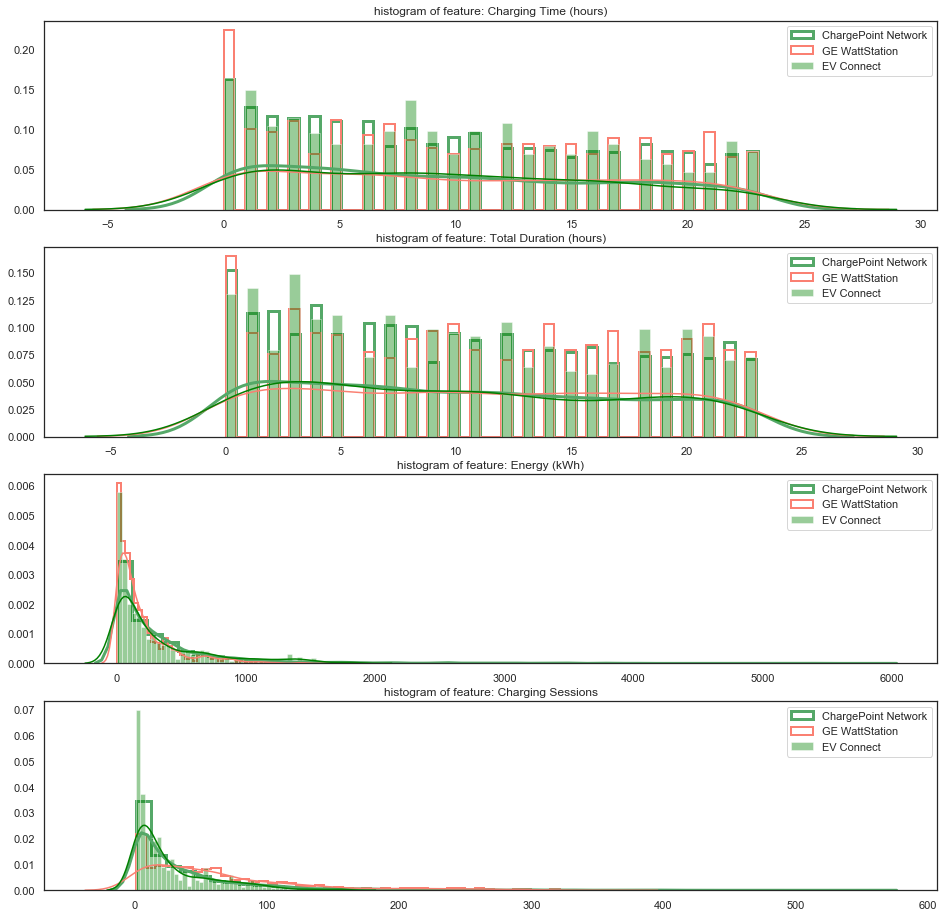

In [19]:
# trends for charger use indicators
indicators = charginguse.iloc[:,3:7].columns
sns.set(style="white")
plt.figure(figsize=(16,4*4))
gs = gridspec.GridSpec(4, 1)
for i, cn in enumerate(charginguse[indicators]):
    ax = plt.subplot(gs[i])
    sns.distplot(charginguse[cn][charginguse.Network == 'ChargePoint Network'], bins=50,
                 hist_kws={"histtype": "step", "linewidth": 3, "alpha": 1, "color": "g"},
                kde_kws={"color": "g", "lw": 3})
    sns.distplot(charginguse[cn][charginguse.Network == 'GE WattStation'], bins=50,hist_kws={"histtype": "step", "linewidth": 2, "alpha": 1, 
                "color": "salmon"},kde_kws={"color": "salmon"})
    sns.distplot(charginguse[cn][charginguse.Network == 'EV Connect'], bins=50,color='Green')
    ax.set_xlabel('')
    ax.set_title('histogram of feature: ' + str(cn))
    ax.legend(labels=['ChargePoint Network','GE WattStation','EV Connect'])
plt.show()

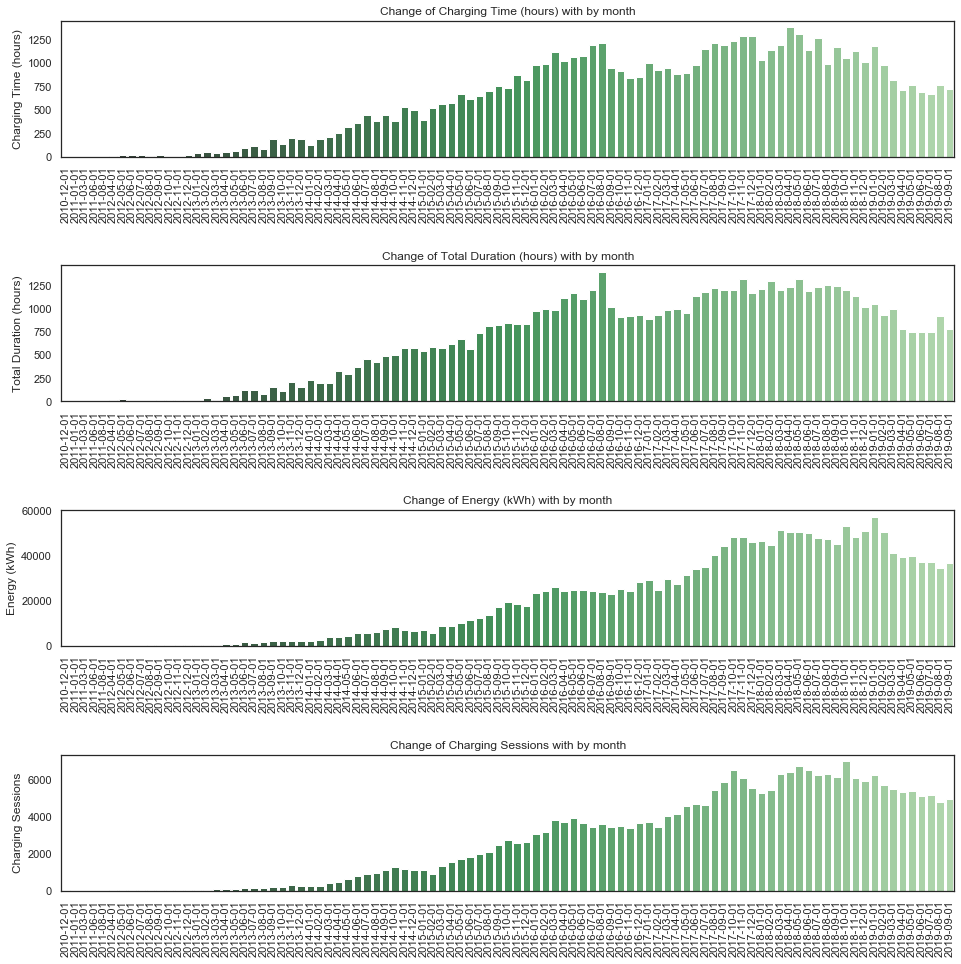

In [20]:
# change of chargeuse indicators with time 
values = charginguse.iloc[:,3:7].columns

plt.figure(figsize=(16,4*4))
gs = gridspec.GridSpec(4, 1)
gs.update(hspace=0.8)
sns.set(style="white")
for i, cn in enumerate(charginguse[values]):
    total = charginguse.loc[:, ["Start Date", cn]].groupby(["Start Date"]).sum().reset_index()
    ax = plt.subplot(gs[i])
    sns.barplot(x = "Start Date", y = cn, data =total,palette="Greens_d")
    x_dates = charginguse["Start Date"].dt.strftime('%Y-%m-%d').sort_values().unique()
    ax.set_xticklabels(labels = x_dates, rotation = "vertical")
    ax.set_xlabel('')
    ax.set_title('Change of ' + str(cn) + ' with by month')
plt.show()

The charge use indicators are not strictly increasing. There are points of stagnation and even decrease. Especially within 2019 the drop we see is unexpected. To inspect charge use trends, I will plot the data by utility provider and zipcode area. 

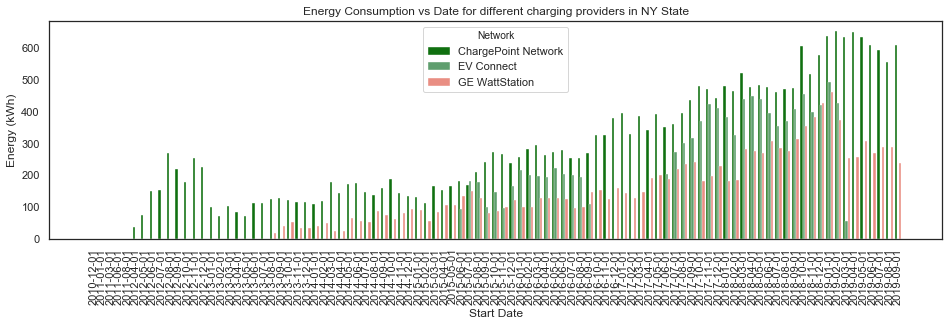

In [21]:
#Now we separete the companies to see how they perform differently 
sns.set(style="white")
fig, ax = plt.subplots(figsize = (16,4)) 
sns.barplot(x = "Start Date", y = "Energy (kWh)", hue = "Network", data = charginguse, ci = None,palette=['Green','g','salmon'],linewidth=0.4)
x_dates = charginguse["Start Date"].dt.strftime('%Y-%m-%d').sort_values().unique()

ax.set_xticklabels(labels = x_dates, rotation = "vertical")
plt.title("Energy Consumption vs Date for different charging providers in NY State")
plt.plot()
plt.show()

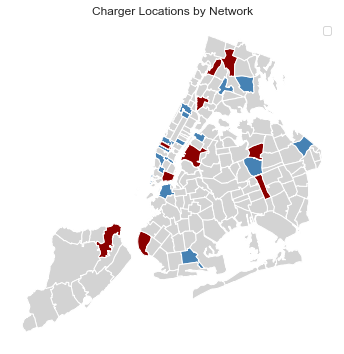

In [26]:
##Turning locations with no data to grey. Source: https://www.earthdatascience.org/courses/earth-analytics-python/spatial-data-vector-shapefiles/python-customize-map-legends-geopandas/
sns.set(style="white")
gdf = pd.merge(charginguse,nyc,left_on='ZIP Code',right_on='ZIPCODE',how ='right')
gdf = gpd.GeoDataFrame(gdf,geometry='geometry')
gdf['Network'] = gdf['Network'].fillna('No Data')

roadPalette = {'ChargePoint Network': 'steelblue',
                'EV Connect': 'darkred',
               'No Data': 'lightgrey'}
labels = []
fig, ax = plt.subplots(figsize=(8, 6))
for ctype, data in gdf.groupby('Network'):
    # Define the color for each group using the dictionary
    color = roadPalette[ctype]
    # Plot each group using the color defined above
    data.plot(color=color,
              ax=ax,
              label=ctype,
             legend=True)
    labels.append(ctype)

ax.legend(labels=labels)

ax.set(title='Charger Locations by Network')

ax.set_axis_off()
plt.show()
##I dont know why legend is not working here 


### 2. Registration Data EDA

When I plot the Energy Consumption and Registration density as a map, we see that separating the areas by zipcode only wont be sufficient. Because, altough some zipcode areas lack EV chargers, they still have relatively high ev registrations. Therefore, I should include some other metrics to account for that mismatch. <br>

Also, there is a drop in registrations after peaking at 04/2019. This can either be due to an actual lack of interest in ev purchases or missing data. But we are almost sure that EV registration dataset is complete. So, I investigated the possible reasons of drop such as change in rebates. 

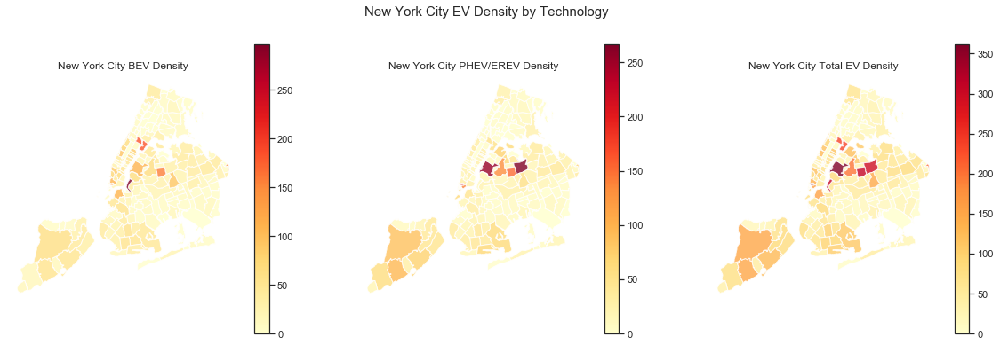

In [37]:
current_evs = pd.read_excel('EV-Registration-Tables.xlsx',sheet_name = "Current by ZIP Code")
gdf = pd.merge(current_evs,nyc,left_on='ZIP Code',right_on='ZIPCODE',how ='right')
gdf = gpd.GeoDataFrame(gdf,geometry='geometry')
gdf['Total EVs'] = gdf['Total EVs'].fillna(0)
gdf['BEV'] = gdf['BEV'].fillna(0)
gdf['PHEV/EREV'] = gdf['PHEV/EREV'].fillna(0)

fig, axes = plt.subplots(1,3, figsize=(20,6))

fig.suptitle('New York City EV Density by Technology',size = 15)
axes[0].set_title("New York City BEV Density")
gdf.plot(ax=axes[0],column = 'BEV',legend=True,cmap = 'YlOrRd',alpha=0.8)

axes[1].set_title("New York City PHEV/EREV Density")
gdf.plot(ax=axes[1],column = 'PHEV/EREV',legend=True,cmap = 'YlOrRd',alpha=0.8)

axes[2].set_title("New York City Total EV Density")
gdf.plot(ax=axes[2],column = 'Total EVs',legend=True,cmap = 'YlOrRd',alpha=0.8)


axes[0].set_axis_off()
axes[1].set_axis_off()
axes[2].set_axis_off()
plt.show()

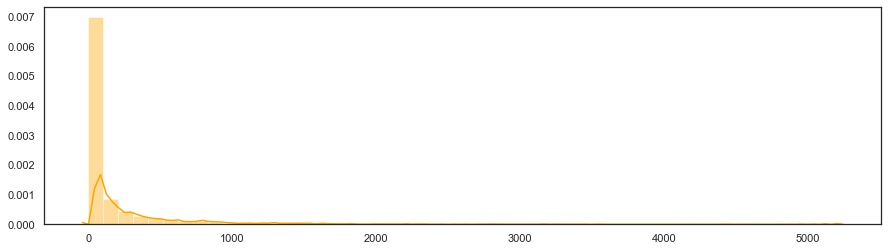

In [38]:
evs = [cumulative_ev_registrations['Registered EVs'].values]
plt.figure(figsize=(15,4))
sns.distplot(evs,color='Orange')
plt.show

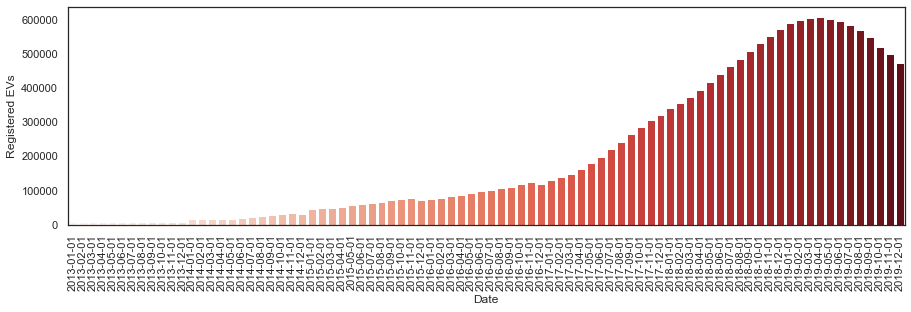

In [359]:
plt.figure(figsize=(15,4))
total_ev = cumulative_ev_registrations.loc[:, ["Date", 'Registered EVs']].groupby(["Date"]).sum().reset_index()
sns.set(style="white")
ax = sns.barplot(x = "Date", y = 'Registered EVs', data =total_ev,palette="Reds")
x_dates = total_ev["Date"].dt.strftime('%Y-%m-%d').sort_values().unique()
ax.set_xticklabels(labels = x_dates, rotation = "vertical")
plt.show()

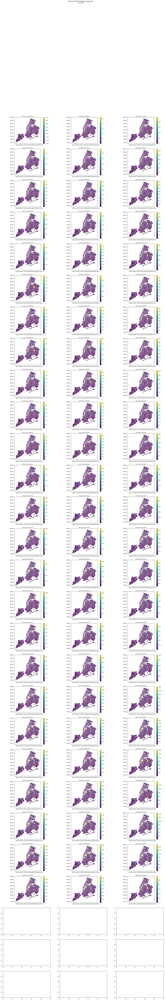

In [27]:
def plot_maps(i,j,by):
    gdf = pd.merge(charginguse[charginguse['Start Date']==dates[3*i+j]],nyc,left_on ='ZIP Code',right_on="ZIPCODE",how ='right')
    gdf = gpd.GeoDataFrame(gdf,geometry='geometry')
    axes[i, j].set_title(str(dates[3*i+j]))
    gdf.plot(ax=axes[i,j],column = by ,legend=True,figsize=(10,5),cmap = 'viridis',alpha=0.8)
##Plot Charger Use Density for each Month
fig, axes = plt.subplots(28,3, figsize=(10*3,2*len(dates)))
fig.suptitle('New York City EV Charger Energy Use\n by Date',size = 15)
for i in range(25):
    for j in range(3):
        plot_maps(i,j,'Energy (kWh)')    

#### Change in Number of Registered EVs with Charger Deployment

In [408]:
zipcode = []

for zipc in charginguse['ZIP Code'].unique():
    if(zipc in nyc['ZIPCODE'].unique()):
        zipcode.append(zipc)

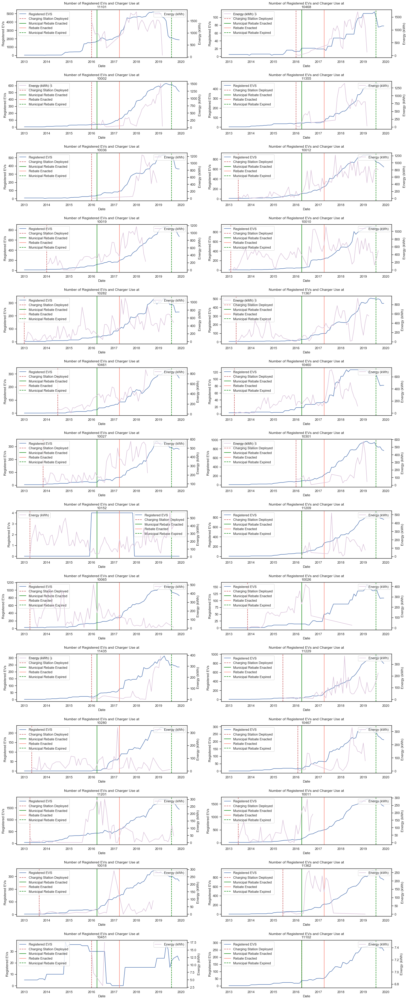

In [1268]:
sns.set(style="white")
plt.figure(figsize=(20,4*14))
gs = gridspec.GridSpec(14,2)
gs.update(hspace = 0.5)

for i, zipc in enumerate(zipcode):
    data = cumulative_ev_registrations[cumulative_ev_registrations["ZIP Code"]==zipc]
    data2 = charginguse[charginguse["ZIP Code"]==zipc]
    
    ax = plt.subplot(gs[i])
    ax2 = ax.twinx()
    
    sns.lineplot(x=data['Date'],y=data['Registered EVs'],ax=ax)
    sns.lineplot(x=data2['Start Date'],y=data2['Energy (kWh)'],ax=ax2, color = 'thistle')
    
    x_line_annotation = charginguse[charginguse['ZIP Code']==zipc]['Start Date'].min()
    ax.axvline(x=x_line_annotation, linestyle='dashed',color='r')
    
    x_line_annotation = ny_rebates.loc[1,'Enacted Date']
    ax.axvline(x=x_line_annotation,color='green')

    x_line_annotation = ny_rebates.loc[0,'Enacted Date']
    ax.axvline(x=x_line_annotation,color='salmon')
    
    x_line_annotation = ny_rebates.loc[1,'Expiration Date']
    ax.axvline(x=x_line_annotation, linestyle='dashed', color='green')
    
    ax.set_xlabel('Date')
    ax.set_title('Number of Registered EVs and Charger Use at\n' + str(zipc))
    ax.legend(['Registered EVS','Charging Station Deployed','Municipal Rebate Enacted',
               'Rebate Enacted','Municipal Rebate Expired'])
    ax2.legend(['Energy (kWh)'])
    

**Key Takewayas**
1. There is a mismatch between the charger locations and where the EVs are located. Therefore in addition to variable: EV Registrations per zipcode we need to include number of registered evs by distance to the charging location. To begin with I will include 10 km, 25km, 50 km, 100 kms and 200kms. 200 kms is choosen as the upper limit since it is the furthest an EV with todays technology can go without charging. 
2. There is a decrease in the ev registrations after peaking at 01/2019. This decrease can be associated with the expiration of Municipal EV Rebate on 02/2019. In a future model aiming to predict EV Registrations, rebates should be included as variables. However, to predict the energy usage the ev registrations will be sufficient. 
2. The Energy Consumption of chargers per ZIP Code area is highly variable. There is not a general trend. 

### Demographic Data EDA

In [59]:
print(demographics[demographics['ZIP Code'].isin(zipcode)].isnull().sum())

print(demographics.dtypes)

print(features[features['ZIP Code'].isin(zipcode)].isnull().sum())

print(features.dtypes)

# ##There are records that prevents me from converting to int. lets find them. 


Year                                                             0
ZIP Code                                                         0
Geography                                                        0
Estimate; Aggregate travel time to work (in minutes):            0
Estimate; Total: - Car, truck, or van - drove alone:             0
Estimate; Total: - Car, truck, or van - carpooled:               0
Estimate; Total: - Public transportation (excluding taxicab):    0
Estimate; Total: - Walked:                                       0
Estimate; Total: - Worked at home:                               0
Median income (dollars); Estimate; Households                    0
dtype: int64
Year                                                             object
ZIP Code                                                         object
Geography                                                        object
Estimate; Aggregate travel time to work (in minutes):            object
Estimate; Total: - Car, truck

In [79]:
## Filter by the zipcodes that we need
demographics_filtered = pd.merge(zipcode_clean, demographics[demographics['ZIP Code'].isin(zipcode)] , how='inner',on = 'ZIP Code')
demographics_merged = pd.merge(demographics_filtered, features, how = 'inner', on=['ZIP Code','Year'])
demographics_merged2 = pd.merge(demographics_merged, employment, how = 'inner', on=['ZIP Code','Year'])

,ZIP Code,Type_x,Primary City_x,State Abbreviation_x,Latitude_x,Longitude_x,Area Land Sq Miles_x,County_x,County GEOID_x,Census Bureau Division_x,...,Female; Estimate; Total population_y,Estimate; Total: - White alone_y,Estimate; Total: - Black or African American alone_y,Estimate; Total: - American Indian and Alaska Native alone_y,Estimate; Total: - Asian alone_y,Estimate; Total: - Native Hawaiian and Other Pacific Islander alone_y,Estimate; Total: - Some other race alone_y,Number of jobs at firms with 500 or more employees_y,Number of jobs at firms with fewer than 500 employees_y,Number of non-federal jobs in all industries_y
0,10002,STANDARD,New York,NY,40.71,-73.99,2277670.0,New York County,36061,Mid-Atlantic,...,41922,23866,6952,177,34908,6,11978,4276.0,16641.0,23441.0
1,10002,STANDARD,New York,NY,40.71,-73.99,2277670.0,New York County,36061,Mid-Atlantic,...,40462,24591,6638,196,33352,8,10432,5329.0,17615.0,27007.0
2,10002,STANDARD,New York,NY,40.71,-73.99,2277670.0,New York County,36061,Mid-Atlantic,...,40007,24502,5817,516,33675,5,10713,4911.0,17597.0,26789.0
3,10010,STANDARD,New York,NY,40.74,-73.98,1011819.0,New York County,36061,Mid-Atlantic,...,15798,22901,1938,202,5087,0,643,44650.0,33033.0,78761.0
4,10010,STANDARD,New York,NY,40.74,-73.98,1011819.0,New York County,36061,Mid-Atlantic,...,16248,24356,1867,214,4963,0,511,48309.0,29845.0,79594.0


In [61]:
def convert_to_float(demographics,features):
    demographics[features] = demographics[features].astype(float)
    return demographics
demographics = demographics_merged2
demographics = demographics.replace('-', np.nan)
demographics = demographics.replace('250,000+', int(250000))
demographics = demographics.dropna(axis=0).reset_index()

In [63]:
columns = ["Estimate; Aggregate travel time to work (in minutes):",
            'Median income (dollars); Estimate; Households','Total; Estimate; Population 25 years and over - Less than 9th grade',
            'Total; Estimate; Population 25 years and over - 9th to 12th grade, no diploma','Male; Estimate; Total population','Female; Estimate; Total population',
            'Estimate; Total: - White alone','Estimate; Total: - Black or African American alone',
            'Estimate; Total: - American Indian and Alaska Native alone','Estimate; Total: - Asian alone',
            'Estimate; Total: - Native Hawaiian and Other Pacific Islander alone','Estimate; Total: - Some other race alone',
          'Number of non-federal jobs in all industries',
       'Number of jobs at firms with 500 or more employees',
       'Number of jobs at firms with fewer than 500 employees']

demogprahics = convert_to_float(demographics,columns)
demographics.head()

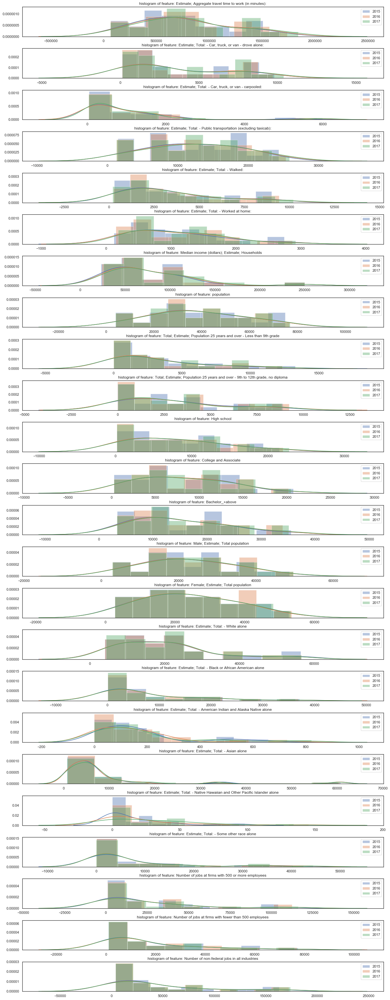

In [66]:
# trends for demogprahic variables
indicators = demographics.iloc[:,15:].columns
sns.set(style="white")
plt.figure(figsize=(20,3*21))
gs = gridspec.GridSpec(27, 1)
gs.update(hspace=0.4)
for i, cn in enumerate(demographics[indicators]):
    ax = plt.subplot(gs[i])
    sns.distplot(demographics[cn][demographics.Year ==2015], bins=10,)
    sns.distplot(demographics[cn][demographics.Year == 2016], bins=10)#,hist_kws={"linewidth": 2, "alpha": 1, 
                #"color": "salmon"},kde_kws={"color": "salmon"})
    sns.distplot(demographics[cn][demographics.Year == 2017], bins=10),#hist_kws={"linewidth": 3, "alpha": 1, "color": "g"},
                        #kde_kws={"color": "salmon", "lw": 3})
    
    ax.set_xlabel('')
    ax.set_title('histogram of feature: ' + str(cn))
    ax.legend(labels=['2015','2016','2017'])
plt.show()

### Distance Matrix and Registered EVs Within Specified Distance Per Month

We have central coordinates for each ZIP Code area, we can find the number of registered EVs within a specified distance. This way, we would be including the EVs that may be traveling to NYC from other cities for work and leisure purposes. 
Since we are working with a monthly dataset, I will first find the ZIP Codes falling within the given distance range and then find the sum of registered EV per each month for that distance. 

In [405]:
def find_distance(x, y, a, b):  
    return np.sqrt((np.subtract(x,a))**2 + np.subtract(y,b)**2)*6371*3.14159265359/180

def get_evs_within_xkm(zipcode_filtered,zipcode_clean,cumulative_ev_registrations,x):
    dist_array = np.zeros((zipcode_filtered.shape[0], zipcode_clean.shape[0]))
    df = pd.DataFrame(columns=['Date','ZIP Code','within_'+str(x)+'km'])

    for i in range(len(zipcode_filtered)):
        dist_array[i,:] = find_distance(zipcode_clean['Latitude'],zipcode_clean['Longitude'],
                                                           zipcode_filtered.loc[i,'Latitude'],zipcode_filtered.loc[i,'Longitude'])
        zipcodes_within_xkm = list(zipcode_clean['ZIP Code'].iloc[np.where(dist_array[i]<=x,True,False)])
        
        within_xkm = cumulative_ev_registrations.loc[cumulative_ev_registrations['ZIP Code'].isin(zipcodes_within_xkm),['Date','Registered EVs']].groupby('Date',as_index=False).sum()
        
        within_xkm.loc[:,'ZIP Code']=zipcode_filtered.loc[i,'ZIP Code']
        
        within_xkm = within_xkm.rename(columns={'Registered EVs':'within_'+str(x)+'km'})
        
        df = pd.concat([df,within_xkm],ignore_index=True)
        
    return df

def merge_files(file_list,column1,column2,how):
    merged_df=file_list[0][[column1,column2]]
    for i in range(len(file_list)):
        merged_df=pd.merge(merged_df,file_list[i],how=how,on=[column1,column2])
    return(merged_df)


In [561]:
#zipcode_filtered stands for zipcodes of interest(new york city zipcodes)

within_10km = get_evs_within_xkm(zipcode_filtered,zipcode_clean,cumulative_ev_registrations,10)
within_25km = get_evs_within_xkm(zipcode_filtered,zipcode_clean,cumulative_ev_registrations,25)
within_50km = get_evs_within_xkm(zipcode_filtered,zipcode_clean,cumulative_ev_registrations,50)
within_100km = get_evs_within_xkm(zipcode_filtered,zipcode_clean,cumulative_ev_registrations,100)

file_list = [cumulative_ev_registrations,within_10km,within_25km,within_50km,within_100km]

registered_evs = merge_files(file_list,'Date','ZIP Code','inner').astype({ 'within_10km':'int64', 'within_25km':'int64',
       'within_50km':'int64', 'within_100km':'int64'})


C:\Users\tugba\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in less_equal
  # This is added back by InteractiveShellApp.init_path()
C:\Users\tugba\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



### Creating Feature Matrix with Previous Months & Previous Years Data

In [562]:
ny_chargeuse = charginguse[charginguse['ZIP Code'].isin(zipcode)].sort_values(by='Start Date').reset_index(drop=True)
ny_registrations = registered_evs[registered_evs['ZIP Code'].isin(zipcode)].sort_values(by='Date').reset_index(drop=True)

In [563]:
# ##In order to be able to merge year of record and year befores demographics data, I created the "Year" column to merge on. 
for i in range(len(ny_chargeuse)):
    ny_chargeuse.loc[i,'Year of Record'] = ny_chargeuse.loc[i,'Start Date'].year
    ny_chargeuse.loc[i,'Year Before'] = ny_chargeuse.loc[i,'Start Date'].year-1

# I created the dataset by merging on the previous years demographics data. 
dataset = pd.merge(ny_chargeuse, demographics,how = 'inner', left_on=['ZIP Code','Year Before'],right_on=['ZIP Code','Year'])
dataset = dataset.drop(['Year of Record'],axis=1)

In [564]:
ny_registrations.loc[:,'Date'] = pd.to_datetime(ny_registrations.loc[:,'Date'])
ny_registrations['ZIP Code'] = ny_registrations['ZIP Code'].astype(str)

In [565]:
# Now merging with one month befores EV Registrations and Charging Use

dataset.loc[:,"Month Before"] = pd.to_datetime(dataset.loc[:,"Start Date"]) - np.timedelta64(1,'M')

series_year = dataset.loc[:,"Month Before"].dt.year
series_month = dataset.loc[:,"Month Before"].dt.month
series_day = pd.Series([1]*len(dataset))

df = pd.DataFrame(columns = ['year','month','day'])
df['year'] = series_year 
df['month'] = series_month 
df['day'] = series_day 

df['Month Before']=pd.to_datetime(df[['year','month','day']])

dataset['Month Before'] = df['Month Before']

dataset = pd.merge(dataset,ny_registrations, how='inner', left_on=['ZIP Code','Month Before'], right_on=['ZIP Code','Date'])


In [988]:
dataset.head()

,Start Date,ZIP Code,Network,Charging Time (hours),Total Duration (hours),Energy (kWh),Charging Sessions,Active Station Count,Active Port Count,Year Before,...,Number of jobs at firms with 500 or more employees,Number of jobs at firms with fewer than 500 employees,Number of non-federal jobs in all industries,Month Before,Date,Registered EVs,within_10km,within_25km,within_50km,within_100km
0,2016-01-01,10468,EV Connect,14,14,39.689,3,2,2,2015.0,...,3691.0,4046.0,10188.0,2015-12-01,2015-12-01,13,4744,19018,30984,42613
1,2016-02-01,10468,EV Connect,1,1,10.082,1,1,1,2015.0,...,3691.0,4046.0,10188.0,2016-01-01,2016-01-01,13,4805,19999,32735,45015
2,2016-03-01,10468,EV Connect,2,3,9.671,2,1,1,2015.0,...,3691.0,4046.0,10188.0,2016-01-01,2016-01-01,13,4805,19999,32735,45015
3,2016-04-01,10468,EV Connect,7,7,47.981,7,2,2,2015.0,...,3691.0,4046.0,10188.0,2016-03-01,2016-03-01,13,4911,22035,35899,49310
4,2016-05-01,10468,EV Connect,12,12,57.522,7,1,1,2015.0,...,3691.0,4046.0,10188.0,2016-03-01,2016-03-01,13,4911,22035,35899,49310


## Forecasting and Prediction Modeling



### 1. Linear Regression, Ridge Regression and Lasso Regression on Monthly EV  Charger Energy Consumption Data

Ridge Regression and Lasso regression models are utilized in this section in order to predict the the future energy demand of EV chargers. For predictions to be meaningful, a feature matrix similar to a time series is created. In order to make predictions of to 't+1'from time 't', the feature_matrix is created using one months before data. This type of approach is adopted to be able to use the existing features at time t and to be not dependent on 'future estimates of features' such as EV registrations, demographics, income and commuting data. This type of model and feature selection will allow making energy demand predictions i.e for 2020 January using 2019 December features, that already exists. 

The EDA suggests that, most of the data is available for NY City and there are some missing data from EV Connect Utility. Therefore, the initial goal of the feature matrix creation is utilization of this informations. The EV connect has missing data for the time span between October 2016 to May 2017, which decreases the aggregate energy consumption within these months. The reason for missing data from EV Connect withing this time span is ambigous, therefore dropping those months is the best way to deal with these type of lost data. In the feature_matrix for the regression analysis those months are dropped and the analysis are performed only on the remaining months where the data is complete. 

Also, considering the differences between the cities, the model is only build for New York City where most of the data exists. Analysis will be performed between 2016.01.01 and 2018.12.01 in a 3 year span. Also, again during the EDA, I have realized that there is variation among the mean of the different zipcodes. I decided to add a dummy variable for each zip code. By adding a zipcode, I aim to capture the variance between zipcodes that are not easily explained by demographics, education and commuting related features.


In [555]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.metrics import mean_squared_error
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.feature_selection import RFE

In [1049]:
df_clean = dataset[['ZIP Code', 'Network', 'Primary City','Start Date','Energy (kWh)','Registered EVs',
                    'within_10km', 'within_25km', 'within_50km',
       'within_100km','Estimate; Aggregate travel time to work (in minutes):',
       'Estimate; Total: - Car, truck, or van - drove alone:',
       'Estimate; Total: - Car, truck, or van - carpooled:',
       'Estimate; Total: - Public transportation (excluding taxicab):',
       'Estimate; Total: - Walked:', 'Estimate; Total: - Worked at home:',
       'Median income (dollars); Estimate; Households', 'population',
       'Total; Estimate; Population 25 years and over - Less than 9th grade',
       'Total; Estimate; Population 25 years and over - 9th to 12th grade, no diploma',
       'High school', 'College and Associate', 'Bachelor_+above',
       'Male; Estimate; Total population',
       'Female; Estimate; Total population', 'Estimate; Total: - White alone',
       'Estimate; Total: - Black or African American alone',
       'Estimate; Total: - American Indian and Alaska Native alone',
       'Estimate; Total: - Asian alone',
       'Estimate; Total: - Native Hawaiian and Other Pacific Islander alone',
       'Estimate; Total: - Some other race alone','Number of non-federal jobs in all industries',
       'Number of jobs at firms with 500 or more employees',
       'Number of jobs at firms with fewer than 500 employees']]

df_clean = df_clean[df_clean['Network']=='ChargePoint Network'].reset_index(drop=True)
df_clean.head()

,ZIP Code,Network,Primary City,Start Date,Energy (kWh),Registered EVs,within_10km,within_25km,within_50km,within_100km,...,Female; Estimate; Total population,Estimate; Total: - White alone,Estimate; Total: - Black or African American alone,Estimate; Total: - American Indian and Alaska Native alone,Estimate; Total: - Asian alone,Estimate; Total: - Native Hawaiian and Other Pacific Islander alone,Estimate; Total: - Some other race alone,Number of non-federal jobs in all industries,Number of jobs at firms with 500 or more employees,Number of jobs at firms with fewer than 500 employees
0,10012,ChargePoint Network,New York,2016-01-01,201.820,70,5383,15634,26911,39657,...,11614.0,18059.0,642.0,42.0,3774.0,20.0,686.0,43226.0,15867.0,27276.0
1,10012,ChargePoint Network,New York,2016-02-01,69.780,70,5584,16360,28353,41917,...,11614.0,18059.0,642.0,42.0,3774.0,20.0,686.0,43226.0,15867.0,27276.0
2,10012,ChargePoint Network,New York,2016-03-01,105.321,70,5584,16360,28353,41917,...,11614.0,18059.0,642.0,42.0,3774.0,20.0,686.0,43226.0,15867.0,27276.0
3,10012,ChargePoint Network,New York,2016-04-01,150.682,91,5973,18083,31119,45909,...,11614.0,18059.0,642.0,42.0,3774.0,20.0,686.0,43226.0,15867.0,27276.0
4,10012,ChargePoint Network,New York,2016-05-01,222.826,91,5973,18083,31119,45909,...,11614.0,18059.0,642.0,42.0,3774.0,20.0,686.0,43226.0,15867.0,27276.0


In [1050]:
## Get Travel Time Per Person ## 
df_clean['Estimate; Aggregate travel time to work (in minutes):'] = df_clean['Estimate; Aggregate travel time to work (in minutes):'].astype(int)
for i in range(len(df_clean)):
    df_clean.loc[i,'Travel Time per Person'] = df_clean.loc[i,'Estimate; Aggregate travel time to work (in minutes):'] / df_clean.loc[i,'population']
    df_clean.loc[i,'Large Company Jobs'] = df_clean.loc[i,'Number of jobs at firms with 500 or more employees'] / df_clean.loc[i,'Number of non-federal jobs in all industries']
    df_clean.loc[i,'Small Company Jobs'] = df_clean.loc[i,'Number of jobs at firms with fewer than 500 employees'] / df_clean.loc[i,'Number of non-federal jobs in all industries']


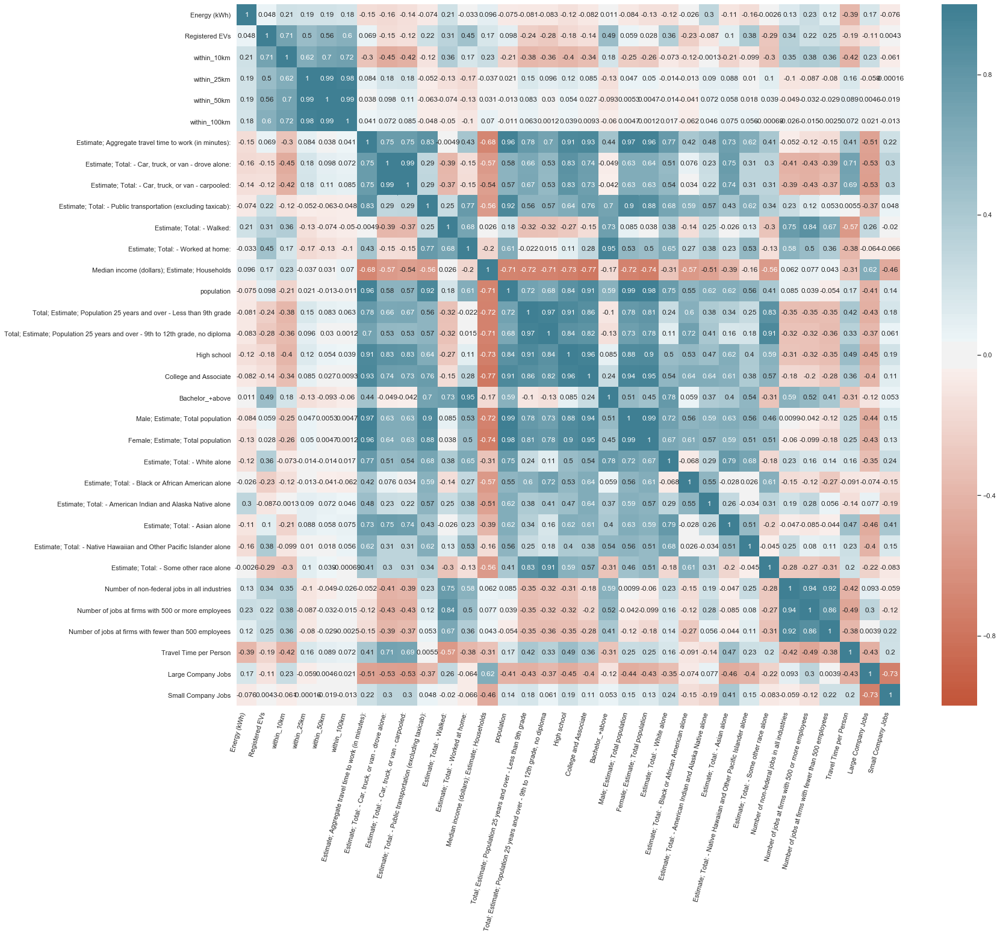

In [1051]:
data = df_clean.iloc[:,4:]
sns.set(style="white")
plt.figure(figsize=(22,20))

corr = data.corr()

ax = sns.heatmap(
    corr, 
    annot=True,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=False,
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=75,
    horizontalalignment='right'
);


In [1166]:
#Function for regularization parameter determination
def model_cv_mse(Model, X, y, alphas, k = 5):
    """
    This function calculates the MSE resulting from k-fold CV using lasso regression performed on a training subset of 
    X and y for different values of alpha.
    Inputs: 
        Model (sklearn model): the type of sklearn model with which to fit the data - LinearRegression, Ridge, or Lasso
        X: the set of features used to fit the model
        y: the set of response variable observations
        alphas: a list of penalty parameters
        k: number of folds in k-fold cross-validation
    Returns:
        mses: a list containing the mean squared cross-validation error corresponding to each value of alpha
    """
    mses = np.zeros((k,len(alphas)))
        
    kf = KFold(n_splits = k, shuffle = True, random_state = 0)
    
    fold = 0
    if(Model != LinearRegression):
        for train_i, val_i in kf.split(X):
            X_f_train = X[train_i]
            X_f_val = X[val_i]
            y_f_train = y.iloc[train_i]
            y_f_val = y.iloc[val_i]
        
            for i in range(len(alphas)):
                model = Model(alpha = alphas[i])

                model.fit(X_f_train, y_f_train)

                y_pred = model.predict(X_f_val)

                mses[fold,i] = mean_squared_error(y_pred,y_f_val)

            fold += 1
    if(Model == LinearRegression):
        for train_i, val_i in kf.split(X):
            X_f_train = X[train_i]
            X_f_val = X[val_i]
            y_f_train = y.iloc[train_i]
            y_f_val = y.iloc[val_i]
        
            for i in range(len(alphas)):
                model = Model()

                model.fit(X_f_train, y_f_train)

                y_pred = model.predict(X_f_val)

                mses[fold,i] = mean_squared_error(y_pred,y_f_val)

            fold += 1
    
    average_mses = np.mean(mses, axis = 0)
    
    return average_mses

In [1052]:
X = df_clean.drop(['ZIP Code', 'Network','Start Date', 'Energy (kWh)',
       'Estimate; Aggregate travel time to work (in minutes):','Primary City'], axis=1)
y = df_clean[['Energy (kWh)']]
    
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

### 1.1 Linear Regression with t-1 Features

We have to decide which features to use. I will first try Backward Elimination and then Recursive Feature Elimination method of scikitlearn.

1. Backward Elimination 
2. Recursive Feature Selection

https://towardsdatascience.com/feature-selection-with-pandas-e3690ad8504b

#### 1.1.1 Backward Elimination for Feature Selection

In [1053]:
import statsmodels.api as sm

#Adding constant column of ones, mandatory for sm.OLS model
X_1 = sm.add_constant(X)

#Fitting sm.OLS model
model = sm.OLS(np.asarray(y),np.asarray(X_1)).fit()

In [1054]:
#Backward Elimination
cols = list(X.columns)
pmax = 1
while (len(cols)>0):
    p= []
    X_1 = X[cols]
    X_1 = sm.add_constant(X_1)
    model = sm.OLS(y,X_1).fit()
    p = pd.Series(model.pvalues.values[1:],index = cols)      
    pmax = max(p)
    feature_with_p_max = p.idxmax()
    if(pmax>0.05):
        cols.remove(feature_with_p_max)
    else:
        break
selected_features_BE = cols
print(selected_features_BE)

X = df_clean[selected_features_BE]
y = df_clean[["Energy (kWh)"]]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

['Registered EVs', 'within_25km', 'within_50km', 'within_100km', 'Estimate; Total: - Car, truck, or van - carpooled:', 'Estimate; Total: - Walked:', 'Total; Estimate; Population 25 years and over - Less than 9th grade', 'Total; Estimate; Population 25 years and over - 9th to 12th grade, no diploma', 'High school', 'College and Associate', 'Bachelor_+above', 'Male; Estimate; Total population', 'Female; Estimate; Total population', 'Estimate; Total: - White alone', 'Estimate; Total: - American Indian and Alaska Native alone', 'Estimate; Total: - Asian alone', 'Number of jobs at firms with fewer than 500 employees', 'Travel Time per Person', 'Large Company Jobs', 'Small Company Jobs']


In [1055]:
X = df_clean[selected_features_BE]
y = df_clean[["Energy (kWh)"]]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

In [1056]:
#Standardizing variables
scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [1060]:
linear_model1 = LinearRegression()
linear_model1.fit(X_train, y_train)

y_pred_linear_model1 = linear_model1.predict(X_test)

linear_model1_mse = mean_squared_error(y_pred_linear_model1, y_test)
linear_model1_rmse= np.sqrt(LinearRegression_mse)
print("Test MSE with Linear Regression:", linear_model1_mse)
print("Test RMSE with Linear Regression", linear_model1_rmse)

Test MSE with Linear Regression: 21948.624845679515
Test RMSE with Linear Regression 151.44463329801206


#### 1.1.2 Recursive Feature Selection

In [1061]:
X = df_clean.drop(['ZIP Code', 'Network','Start Date', 'Energy (kWh)',
       'Estimate; Aggregate travel time to work (in minutes):','Primary City','within_100km',
                  'Number of non-federal jobs in all industries',
       'Number of jobs at firms with 500 or more employees',
       'Number of jobs at firms with fewer than 500 employees',], axis=1)
y = df_clean[['Energy (kWh)']]


In [1062]:
#no of features

n_features=np.arange(1,len(X.columns)+1)

high_score=0


#Variable to store the optimum features
nof=0           
score_list =[]

for n in range(len(n_features)):
    
    X_train, X_test, y_train, y_test = train_test_split(X,y.values.ravel(), test_size = 0.2, random_state = 0)
    
    model = LinearRegression()
    
    rfe = RFE(model,n_features[n])
    
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    
    X_test_rfe = rfe.transform(X_test)
    
    model.fit(X_train_rfe,y_train)
    
    score = model.score(X_test_rfe,y_test)
    
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = n_features[n]

print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 27
Score with 27 features: 0.545407


In [1000]:
cols = list(X.columns)

linear_model2 = LinearRegression()
#Initializing RFE linear_model2
rfe = RFE(linear_model2, nof)
#Transforming data using RFE
X_rfe = rfe.fit_transform(X,y.values.ravel())  
#Fitting the data to linear_model2
linear_model2.fit(X_rfe,y.values.ravel())

temp = pd.Series(rfe.support_,index = cols)
selected_features_rfe = temp[temp==True].index
print(selected_features_rfe)

Index(['Estimate; Total: - Car, truck, or van - drove alone:',
       'Estimate; Total: - Car, truck, or van - carpooled:',
       'Estimate; Total: - Walked:', 'Estimate; Total: - Worked at home:',
       'population',
       'Total; Estimate; Population 25 years and over - Less than 9th grade',
       'Total; Estimate; Population 25 years and over - 9th to 12th grade, no diploma',
       'College and Associate', 'Bachelor_+above',
       'Estimate; Total: - American Indian and Alaska Native alone',
       'Estimate; Total: - Native Hawaiian and Other Pacific Islander alone',
       'Travel Time per Person', 'Small Company Jobs', 'ZIP_10010',
       'ZIP_10011', 'ZIP_10012', 'ZIP_10018', 'ZIP_10019', 'ZIP_10026',
       'ZIP_10027', 'ZIP_10065', 'ZIP_10280', 'ZIP_10282', 'ZIP_10460',
       'ZIP_10461', 'ZIP_11102', 'ZIP_11201', 'ZIP_11229', 'ZIP_11362',
       'ZIP_11367'],
      dtype='object')


In [1001]:
X = df_clean[selected_features_rfe]
y = df_clean[["Energy (kWh)"]]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)


In [1003]:
linear_model2 = LinearRegression()
linear_model2.fit(X_train, y_train)

y_pred_linear_model2 = linear_model2.predict(X_test)

linear_model2_mse = mean_squared_error(y_pred_linear_model2, y_test)
linear_model2_rmse= np.sqrt(linear_model2_mse)
print("Test MSE with Linear Regression:", linear_model2_mse)
print("Test RMSE with Linear Regression", linear_model2_rmse)

Test MSE with Linear Regression: 24734.276877886376
Test RMSE with Linear Regression 157.2713479241733


In [597]:
print("Intercept:", linear.intercept_)
# Coefficients
print("Coefficients:", linear.coef_)

Intercept: [314.72965029]
Coefficients: [[   75.89803577   -58.43640993   614.56536945  -556.00244457
   -498.71156621   456.22320814  -761.14090824  -174.7858259
   -260.23797803   156.35338029 16423.80021902 -1768.2360026
  -1247.24643721 -4116.26957134 -3652.96108897 -6812.68739996
  -1565.89709373 -3158.76819652  1353.40264131   848.38825421
    131.45658822   395.90624545    86.55482673   691.05736734
    -42.55572524   -75.94315693   -32.9229948 ]]


### 1.2. Ridge Regression with t-1 Features

In [1008]:
X = df_clean.drop(['ZIP Code', 'Network','Start Date', 'Energy (kWh)',
       'Estimate; Aggregate travel time to work (in minutes):','Primary City','within_100km'], axis=1)
y = df_clean[['Energy (kWh)']]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [1009]:
alphas_test = [0,0.01, 0.1, 1, 10, 100, 1000, 10000]
model_cv_mse(Ridge, X_train, y_train, alphas_test)

array([4.60670354e+31, 3.37883686e+04, 3.38189323e+04, 3.52622586e+04,
       3.80612560e+04, 3.96376040e+04, 5.50384156e+04, 7.05899866e+04])

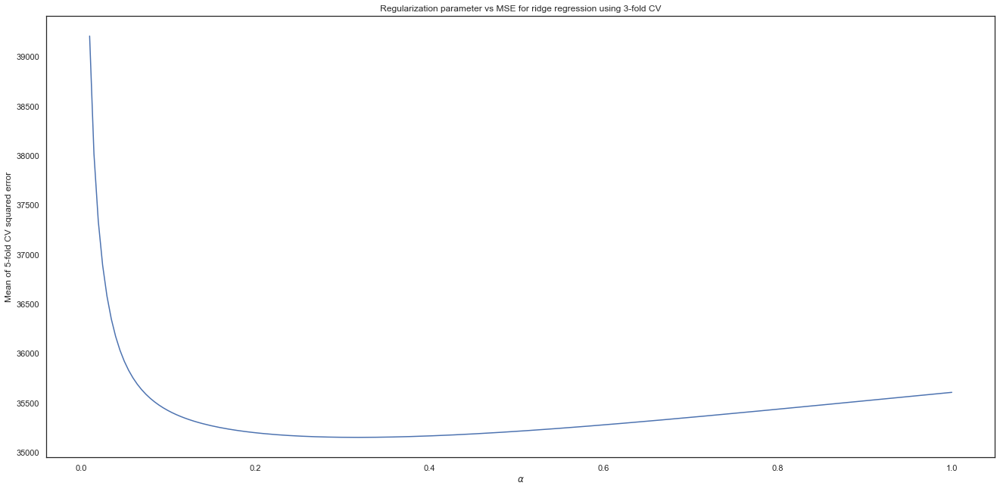

In [1256]:
#5 Fold CV is used to determine model parameters since I have 200 datapoints.
alphas_ridge = np.linspace(0.01,1,200)

plt.figure(figsize = (20,10))

plt.plot(alphas_ridge, model_cv_mse(Ridge, X_train, y_train, alphas_ridge, 3))
plt.title("Regularization parameter vs MSE for ridge regression using 3-fold CV")
plt.xlabel(r"$\alpha$")
plt.ylabel("Mean of 5-fold CV squared error")

plt.show()

In [1016]:
from sklearn.linear_model import RidgeCV

alphas_ridge = np.linspace(0, 0.4, 200)

kf = KFold(n_splits = 3, shuffle = True, random_state = 0)
ridgecv1 = RidgeCV(cv = kf, alphas=alphas_ridge)
ridgecv1.fit(X_train, y_train)

alpha_opt = ridgecv1.alpha_
print("optimal alpha:", alpha_opt)
y_pred_ridgecv1 = ridgecv1.predict(X_test)

ridgecv1_mse = mean_squared_error(y_pred_ridgecv1, y_test)
ridgecv1_rmse= np.sqrt(ridgecv1_mse)
print("Test MSE with cross-validated Ridge:", ridgecv1_mse)
print("Test RMSE with cross-validated Ridge:", ridgecv1_rmse)

optimal alpha: 0.2512562814070352
Test MSE with cross-validated Ridge: 21168.981208537512
Test RMSE with cross-validated Ridge: 145.4956398265512


In [1017]:
## The cross-validaation results suggests using alpha = 28040 for the best results. 
print("Intercept:", ridgecv1.intercept_)
# Coefficients
print("Coefficients:", ridgecv1.coef_)

Intercept: [314.72965029]
Coefficients: [[  45.18844494   16.46810691  284.75005265 -278.3840828   127.57646387
     8.4394827  -469.32562003  488.04178769   97.83875395 -317.76894161
   -54.03885814   24.82523264  133.24442422 -199.6688604   346.03376649
  -166.52509933 -327.13839149  -81.20465283 -243.89331128 -137.20565835
   140.86811935  116.56704596   45.58889077  -20.47826577   45.6816543
   176.04836619 -138.58840944   -3.01451988 -270.23799415 -171.11945186
    41.21225164   65.40151906   53.42648804 -188.5323102  -184.21564812
    82.37073317  108.58456152 -152.36889564  -45.52462842  172.37389333
     8.51510527  -95.13159513   -6.13101959  205.87090614  251.22124703
  -151.64874364 -139.11893191]]


### 1.3. Lasso Regression with t-1 Features

In [1253]:
X = df_clean.drop(['ZIP Code', 'Network','Start Date', 'Energy (kWh)',
       'Estimate; Aggregate travel time to work (in minutes):','Primary City'], axis=1)
y = df_clean[['Energy (kWh)']]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [1254]:
alphas_test = [0,0.01, 0.1, 1, 10, 100, 1000, 10000]
model_cv_mse(Lasso, X_train, y_train, alphas_test)

array([34568.65788992, 34594.93428883, 34516.91686545, 37428.88092055,
       40144.72735032, 72726.62045132, 74484.99980762, 74484.99980762])

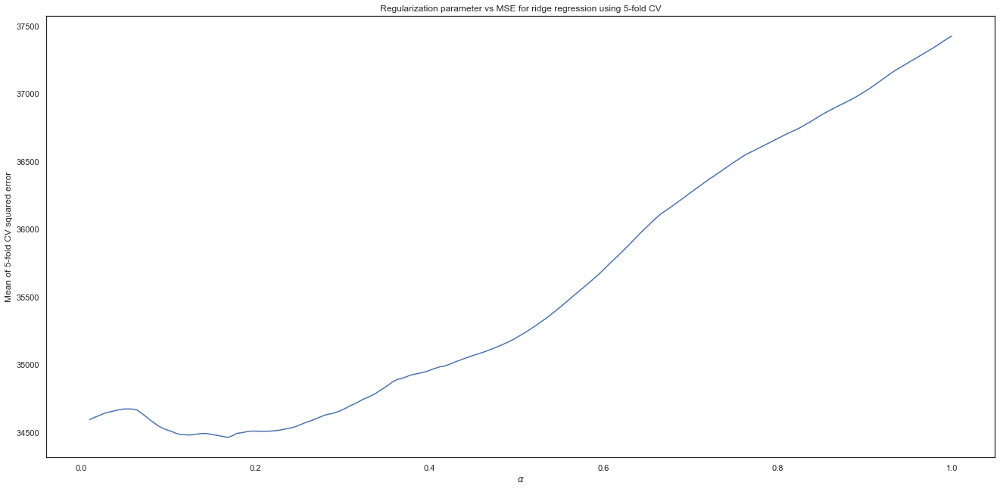

In [1255]:
alphas_lasso = np.linspace(0.01,1, 200)
plt.figure(figsize = (20,10))

plt.plot(alphas_lasso, model_cv_mse(Lasso, X_train, y_train, alphas_lasso, 5))
plt.title("Regularization parameter vs MSE for ridge regression using 5-fold CV")
plt.xlabel(r"$\alpha$")
plt.ylabel("Mean of 5-fold CV squared error")

plt.show()

In [1022]:
from sklearn.linear_model import LassoCV

alphas_lasso = np.linspace(0.05,0.25,200)

kf = KFold(n_splits = 5, shuffle = True, random_state = 0)
lassocv1 = LassoCV(cv = kf, alphas=alphas_lasso)
lassocv1.fit(X_train, y_train.values.ravel())

alpha_opt = lassocv1.alpha_
print("optimal alpha:", alpha_opt)

y_pred_lassocv1 = lassocv1.predict(X_test)

lassocv1_mse = mean_squared_error(y_pred_lassocv1, y_test.values.ravel())
lassocv1_rmse= np.sqrt(lassocv1_mse)

print("Test MSE with cross-validated Lasso:", lassocv1_mse)
print("Test RMSE with cross-validated Lasso:", lassocv1_rmse)

optimal alpha: 0.14145728643216082
Test MSE with cross-validated Lasso: 21461.545264411412
Test RMSE with cross-validated Lasso: 146.49759473933833


In [1023]:
print("Intercept:", lassocv1.intercept_)
# Coefficients
print("Coefficients:", lassocv1.coef_)

Intercept: 314.72965028901734
Coefficients: [  38.45154559   17.17766394  284.47643316 -266.47363258    0.
   -0.         -455.96388405  613.67298301   90.56774444 -362.23398312
  -77.67468757   -0.           -0.          -71.54548377  390.06368682
 -347.42902923 -341.47192263   -0.           -0.           -0.
  149.20077492   88.8046756    49.04604189   -3.73246875    0.
   52.39993337 -159.45902097    0.         -253.56896905 -184.79509069
   84.69782689   69.8058049   100.13443401  -58.53578873  -99.579059
   48.84364645    6.09900617 -149.95232338   -0.62694356  246.48378118
  -26.04528354 -102.86385937   -7.30653429  224.54453138  148.84611183
  -78.79886557 -133.88145699]


In [1024]:
d = {'Features': X.columns, 'Lasso Coefficients': lassocv1.coef_}
Coefficients = pd.DataFrame(data=d)
Coefficients

,Features,Lasso Coefficients
0,Registered EVs,38.451546
1,within_10km,17.177664
2,within_25km,284.476433
3,within_50km,-266.473633
4,"Estimate; Total: - Car, truck, or van - drove ...",0.000000
5,"Estimate; Total: - Car, truck, or van - carpoo...",-0.000000
6,Estimate; Total: - Public transportation (excl...,-455.963884
7,Estimate; Total: - Walked:,613.672983
8,Estimate; Total: - Worked at home:,90.567744
9,Median income (dollars); Estimate; Households,-362.233983


### 1.4 Linear Regression with ZIP Code Dummy Variable and t-1 Features

1. Backward Selection 
2. Recursive Selection 

In [1063]:
df_clean['ZIP'] = df_clean['ZIP Code']
df_clean = pd.get_dummies(df_clean, columns=['ZIP'])


In [1064]:
X = df_clean.drop(['ZIP Code', 'Network','Start Date', 'Energy (kWh)',
       'Estimate; Aggregate travel time to work (in minutes):','Primary City'], axis=1)
y = df_clean[['Energy (kWh)']]

#### 1.4.1. Backward Selection

In [1065]:
import statsmodels.api as sm

#Adding constant column of ones, mandatory for sm.OLS model
X_1 = sm.add_constant(X)

#Fitting sm.OLS model
model = sm.OLS(np.asarray(y),np.asarray(X_1)).fit()
model.pvalues

#Backward Elimination
cols = list(X.columns)
pmax = 1
while (len(cols)>0):
    p= []
    X_1 = X[cols]
    X_1 = sm.add_constant(X_1)
    model = sm.OLS(y,X_1).fit()
    p = pd.Series(model.pvalues.values[1:],index = cols)      
    pmax = max(p)
    feature_with_p_max = p.idxmax()
    if(pmax>0.05):
        cols.remove(feature_with_p_max)
    else:
        break
selected_features_BE = cols
print(selected_features_BE)



['within_25km', 'Estimate; Total: - Car, truck, or van - drove alone:', 'Estimate; Total: - Car, truck, or van - carpooled:', 'Estimate; Total: - Public transportation (excluding taxicab):', 'Estimate; Total: - Walked:', 'Estimate; Total: - Worked at home:', 'population', 'Total; Estimate; Population 25 years and over - Less than 9th grade', 'Total; Estimate; Population 25 years and over - 9th to 12th grade, no diploma', 'High school', 'College and Associate', 'Bachelor_+above', 'Male; Estimate; Total population', 'Female; Estimate; Total population', 'Estimate; Total: - White alone', 'Estimate; Total: - Black or African American alone', 'Estimate; Total: - American Indian and Alaska Native alone', 'Estimate; Total: - Native Hawaiian and Other Pacific Islander alone', 'Estimate; Total: - Some other race alone', 'Number of non-federal jobs in all industries', 'Number of jobs at firms with 500 or more employees', 'Number of jobs at firms with fewer than 500 employees', 'Travel Time per P

In [1071]:
X = df_clean[selected_features_BE]
y = df_clean[["Energy (kWh)"]]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

In [1072]:

scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [1102]:
linear_model3 = LinearRegression()
linear_model3.fit(X_train, y_train)

y_pred_linear_model3 = linear_model3.predict(X_test)

linear_model3_mse = mean_squared_error(y_pred_linear_model3, y_test)
linear_model3_rmse= np.sqrt(linear_model3_mse)
print("Test MSE with Linear Regression:", linear_model3_mse)
print("Test RMSE with Linear Regression:", linear_model3_rmse)

Test MSE with Linear Regression: 25535.198982305654
Test RMSE with Linear Regression: 159.79736850870123


#### 1.4.2. Recursive Feature Selection

In [1076]:
X = df_clean.drop(['ZIP Code', 'Network','Start Date', 'Energy (kWh)',
       'Estimate; Aggregate travel time to work (in minutes):','Primary City'], axis=1)
y = df_clean[['Energy (kWh)']]

In [1077]:
#no of features

n_features=np.arange(1,len(X.columns)+1)

high_score=0


#Variable to store the optimum features
nof=0           
score_list =[]

for n in range(len(n_features)):
    
    X_train, X_test, y_train, y_test = train_test_split(X,y.values.ravel(), test_size = 0.2, random_state = 0)
    
    model = LinearRegression()
    
    rfe = RFE(model,n_features[n])
    
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    
    X_test_rfe = rfe.transform(X_test)
    
    model.fit(X_train_rfe,y_train)
    
    score = model.score(X_test_rfe,y_test)
    
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = n_features[n]

print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 32
Score with 32 features: 0.655346


In [1078]:
cols = list(X.columns)

model = LinearRegression()
#Initializing RFE model
rfe = RFE(model, nof)
#Transforming data using RFE
X_rfe = rfe.fit_transform(X,y.values.ravel())  
#Fitting the data to model
model.fit(X_rfe,y.values.ravel())

temp = pd.Series(rfe.support_,index = cols)
selected_features_rfe = temp[temp==True].index
print(selected_features_rfe)

Index(['Estimate; Total: - Car, truck, or van - drove alone:',
       'Estimate; Total: - Car, truck, or van - carpooled:',
       'Estimate; Total: - Walked:', 'Estimate; Total: - Worked at home:',
       'population',
       'Total; Estimate; Population 25 years and over - Less than 9th grade',
       'Total; Estimate; Population 25 years and over - 9th to 12th grade, no diploma',
       'High school', 'College and Associate', 'Bachelor_+above',
       'Estimate; Total: - American Indian and Alaska Native alone',
       'Estimate; Total: - Native Hawaiian and Other Pacific Islander alone',
       'Travel Time per Person', 'Large Company Jobs', 'Small Company Jobs',
       'ZIP_10010', 'ZIP_10011', 'ZIP_10012', 'ZIP_10018', 'ZIP_10019',
       'ZIP_10026', 'ZIP_10027', 'ZIP_10065', 'ZIP_10280', 'ZIP_10282',
       'ZIP_10460', 'ZIP_10461', 'ZIP_11102', 'ZIP_11201', 'ZIP_11229',
       'ZIP_11362', 'ZIP_11367'],
      dtype='object')


In [1080]:
X = df_clean[selected_features_rfe]
y = df_clean[["Energy (kWh)"]]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

linear_model4 = LinearRegression()
linear_model4.fit(X_train, y_train)

y_pred_linear_model4 = linear_model4.predict(X_test)

linear_model4_mse = mean_squared_error(y_pred_linear_model4, y_test)
linear_model4_rmse= np.sqrt(linear_model4_mse)
print("Test MSE with Linear Regression:", linear_model4_mse)
print("Test RMSE with Linear Regression", linear_model4_rmse)

Test MSE with Linear Regression: 24666.492047538948
Test RMSE with Linear Regression 157.05569727819156


### 1.5 Ridge Regression with ZIP Code Dummy Variable and t-1 Features

In [1081]:
X = df_clean.drop(['ZIP Code', 'Network','Start Date', 'Energy (kWh)',
       'Estimate; Aggregate travel time to work (in minutes):','Primary City'], axis=1)
y = df_clean[['Energy (kWh)']]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [1082]:
alphas_test = [0,0.01, 0.1, 1, 10, 100, 1000, 10000]
model_cv_mse(Ridge, X_train, y_train, alphas_test)

array([2.44483892e+30, 3.40750169e+04, 3.38146329e+04, 3.51020148e+04,
       3.80559670e+04, 3.96443322e+04, 5.49095826e+04, 7.05107531e+04])

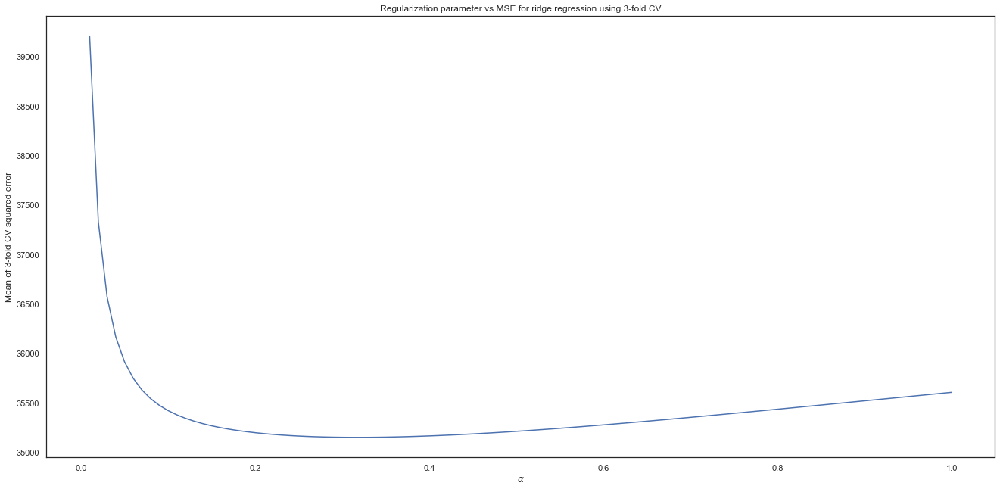

In [1083]:
#5 Fold CV is used to determine model parameters since I have 200 datapoints.
alphas_ridge = np.linspace(0.01,1,100)

plt.figure(figsize = (20,10))

plt.plot(alphas_ridge, model_cv_mse(Ridge, X_train, y_train, alphas_ridge, 3))
plt.title("Regularization parameter vs MSE for ridge regression using 3-fold CV")
plt.xlabel(r"$\alpha$")
plt.ylabel("Mean of 3-fold CV squared error")

plt.show()

In [1085]:
alphas_ridge = np.linspace(0.2, 0.4, 200)

kf = KFold(n_splits = 3, shuffle = True, random_state = 0)
ridgecv2 = RidgeCV(cv = kf, alphas=alphas_ridge)
ridgecv2.fit(X_train, y_train)

alpha_opt = ridgecv2.alpha_
print("optimal alpha:", alpha_opt)

y_pred_ridgecv2 = ridgecv2.predict(X_test)

ridgecv2_mse = mean_squared_error(y_pred_ridgecv2, y_test)
ridgecv2_rmse= np.sqrt(ridgecv2_mse)
print("Test MSE with cross-validated Ridge:", ridgecv2_mse)
print("Test RMSE with cross-validated Ridge:", ridgecv2_rmse)


optimal alpha: 0.3236180904522613
Test MSE with cross-validated Ridge: 21014.298461621198
Test RMSE with cross-validated Ridge: 144.9630934466466


### 1.6 Lasso Regression with ZIP Code Dummy and t-1 Features

In [1086]:
X = df_clean.drop(['ZIP Code', 'Network','Start Date', 'Energy (kWh)',
       'Estimate; Aggregate travel time to work (in minutes):','Primary City'], axis=1)
y = df_clean[['Energy (kWh)']]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 1)

scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [1087]:
alphas_test = [0,0.01, 0.1, 1, 10, 100, 1000, 10000]
model_cv_mse(Ridge, X_train, y_train, alphas_test)

array([2.44483892e+30, 3.40750169e+04, 3.38146329e+04, 3.51020148e+04,
       3.80559670e+04, 3.96443322e+04, 5.49095826e+04, 7.05107531e+04])

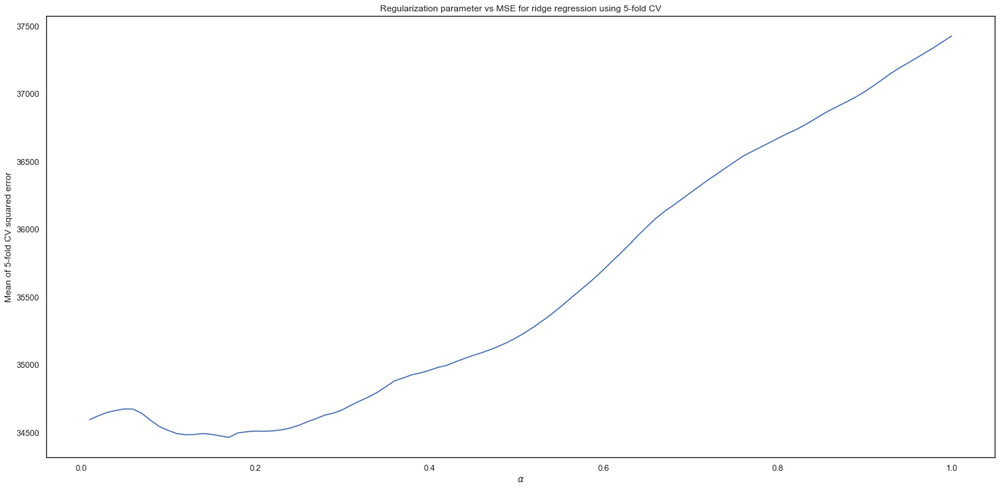

In [1088]:
alphas_lasso = np.linspace(0.01,1, 100)
plt.figure(figsize = (20,10))

plt.plot(alphas_lasso, model_cv_mse(Lasso, X_train, y_train, alphas_lasso, 5))

plt.title("Regularization parameter vs MSE for ridge regression using 5-fold CV")

plt.xlabel(r"$\alpha$")

plt.ylabel("Mean of 5-fold CV squared error")

plt.show()

In [1089]:
## The plot suggests trying lower alphas in contrast with  the first lasso model 
alphas_lasso = np.linspace(0,0.3,100)

kf = KFold(n_splits = 5, shuffle = True, random_state = 0)
lassocv2 = LassoCV(cv = kf, alphas=alphas_lasso)

lassocv2.fit(X_train, y_train.values.ravel())

alpha_opt = lassocv2.alpha_
print("optimal alpha:", alpha_opt)

y_pred_lassocv2 = lassocv2.predict(X_test)

lassocv2_mse = mean_squared_error(y_pred_lassocv2, y_test.values.ravel())
lassocv2_rmse= np.sqrt(lassocv2_mse)

print("Test MSE with cross-validated Lasso:", lassocv2_mse)
print("Test RMSE with cross-validated Lasso:", lassocv2_rmse)

optimal alpha: 0.11515151515151516
Test MSE with cross-validated Lasso: 21526.712287307248
Test RMSE with cross-validated Lasso: 146.7198428546979


In [643]:
print("Intercept:", lassocv2.intercept_)
# Coefficients
print("Coefficients:", lassocv2.coef_)


Intercept: 314.7296502890174
Coefficients: [  40.95525989   30.73736767  288.18259528 -128.86311116 -155.78799282
    0.            9.85177057 -484.63207656  594.32996761  106.62564491
 -352.0414891   -86.56851096    0.            2.33994892  -64.10273678
  415.23231425 -355.0977577  -368.44924229    0.           -0.
   -0.          156.24767468  129.18805566   50.65041096   -9.08162962
    4.58463924   61.5155355  -164.58794812    0.         -279.88361742
 -220.43724484   86.03839335   84.13508947  117.0141622   -58.01949902
  -93.55886405   56.33648742    4.03686643 -143.35415859   -0.
  235.1500016   -14.56356697 -123.77643907   -6.15150474  218.661961
  141.36634141  -92.64225601 -165.05972799]


In [1091]:
d = {'Features': X.columns, 'Lasso Coefficients': lassocv2.coef_}
Coefficients = pd.DataFrame(data=d)
Coefficients

,Features,Lasso Coefficients
0,Registered EVs,40.955260
1,within_10km,30.737368
2,within_25km,288.182595
3,within_50km,-128.863111
4,within_100km,-155.787993
5,"Estimate; Total: - Car, truck, or van - drove ...",0.000000
6,"Estimate; Total: - Car, truck, or van - carpoo...",9.851771
7,Estimate; Total: - Public transportation (excl...,-484.632077
8,Estimate; Total: - Walked:,594.329968
9,Estimate; Total: - Worked at home:,106.625645


### 2.1 Random Forest 

In [1105]:
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn import tree

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

from pprint import pprint

In [1129]:
features = df_clean.drop(['ZIP Code', 'Network','Start Date', 'Energy (kWh)',
       'Estimate; Aggregate travel time to work (in minutes):','Primary City',], axis=1)
target = df_clean[['Energy (kWh)']]

# split test set
X, X_test, y, y_test = train_test_split(features, target, random_state = 1, test_size = .2)

# split between train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, random_state = 1, test_size = 0.25)

In [1107]:
rf_tree = RandomForestRegressor(random_state=1)
rf_tree.fit(X_train, y_train)

rf_train_score = rf_tree.score(X_train, y_train)
rf_val_score = rf_tree.score(X_val, y_val)

print('Train Score: ', rf_train_score)
print('Validation Score: ', rf_val_score)

Train Score:  0.8888979730869785
Validation Score:  0.590656728650008


In [1108]:
y_pred_rf = rf_tree.predict(X_test)

rf_mse = mean_squared_error(y_pred_rf, y_test.values.ravel())
rf_rmse= np.sqrt(rf_mse)

print("Test MSE with Random Forest:", rf_mse)
print("Test RMSE with Random Forest", rf_rmse)

Test MSE with Random Forest: 25816.58260415065
Test RMSE with Random Forest 160.67539514235105


#### 2.1.1 Cross-Validation for Parameter Tuning

In [1109]:
pprint(rf.get_params())

{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 2000,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}


max_depth = max number of levels in each decision tree

max_features = max number of features considered for splitting a node

min_samples_split = min number of data points placed in a node before the node is split

min_samples_leaf = min number of data points allowed in a leaf node

bootstrap = method for sampling data points (with or without replacement)

n_estimators = number of trees in the foreset

In [1110]:
%%time

param_dist = {'n_estimators': randint(1,100),
               'max_depth': randint(1, 10),
              'max_features': randint(1, 30),
              'max_leaf_nodes': randint(3, 100),
              'min_samples_leaf': randint(1, 40),
              'min_samples_split': randint(2,40),
             'bootstrap':[True,False]}

rnd_gb_search = RandomizedSearchCV(rf_tree, param_distributions=param_dist, 
                                cv=5, n_iter=300,random_state=1)

rnd_gb_search.fit(X_train, y_train)

print(rnd_gb_search.best_params_)

{'bootstrap': False, 'max_depth': 6, 'max_features': 5, 'max_leaf_nodes': 26, 'min_samples_leaf': 3, 'min_samples_split': 15, 'n_estimators': 27}
Wall time: 1min 55s


In [1111]:
rf_tree.set_params(bootstrap=False,max_depth=6, max_features=5, max_leaf_nodes=26, min_samples_leaf= 3,
                   min_samples_split=15,n_estimators = 27)
rf_tree.fit(X_train, y_train)

print('Train Score: ', rf_tree.score(X_train, y_train))
print('Validation Score: ', rf_tree.score(X_val, y_val))

Train Score:  0.7434939345381363
Validation Score:  0.649327444585251


In [1112]:
# Use the forest's predict method on the test data

y_pred_rf = rf_tree.predict(X_test)

rf_mse = mean_squared_error(y_pred_rf, y_test.values.ravel())
rf_rmse= np.sqrt(rf_mse)

print("Test MSE with Random Forest:", rf_mse)
print("Test RMSE with Random Forest", rf_rmse)


Test MSE with Random Forest: 21094.37273226655
Test RMSE with Random Forest 145.23901931735338


#### 2.1.3 Variable Importance

Text(0.5, 1.0, 'Random Forest Feature Importance')

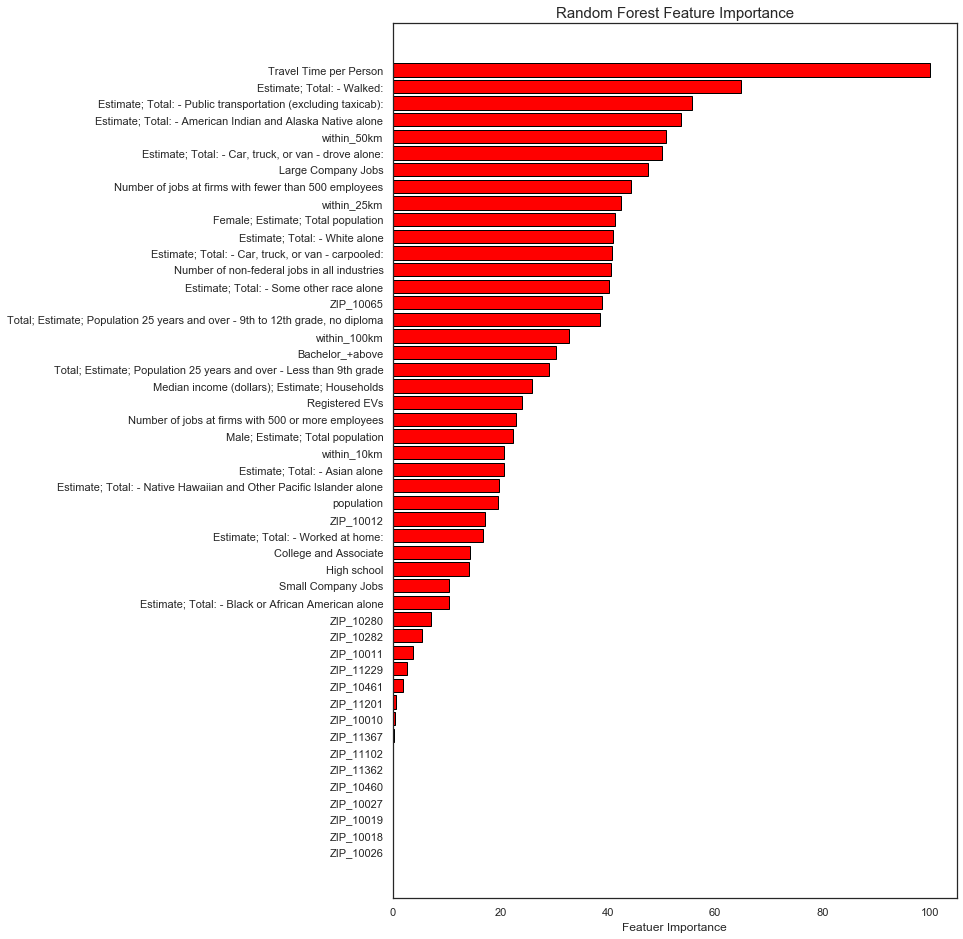

In [1251]:
# Get numerical feature importances
importances = list(rf_tree.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(X.columns, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

feature_importance = rf_tree.feature_importances_
#relative feature importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
rf_feat = pd.DataFrame({'feature':X_train.columns, 'importance':feature_importance})

rf_feat = rf_feat.sort_values(by='importance', ascending=True)

plt.figure(figsize=(9, 15))
plt.barh(width=rf_feat.importance, y=rf_feat.feature,color='red',edgecolor = 'black');

plt.ylabel(''); plt.xlabel('Featuer Importance'); plt.title('Random Forest Feature Importance',size=15)

### 3.1. Bagging Regressor 

In [932]:
from sklearn.ensemble import BaggingRegressor

bag_tree = BaggingRegressor(random_state = 1, n_estimators = 100, max_samples = 259, max_features = 25)
bag_tree.fit(X_train, y_train)

bag_train_score = bag_tree.score(X_train, y_train)
bag_val_score = bag_tree.score(X_val, y_val)

print('Train Score: ', bag_train_score)
print('Validation Score: ', bag_val_score)

Train Score:  0.9140939822932627
Validation Score:  0.6720495075158177


In [933]:
y_pred_rf = bag_tree.predict(X_test)

rf_mse = mean_squared_error(y_pred_rf, y_test.values.ravel())
rf_rmse= np.sqrt(rf_mse)

print("Test MSE with Random Forest:", rf_mse)
print("Test RMSE with Random Forest", rf_rmse)

Test MSE with Random Forest: 22471.831577751953
Test RMSE with Random Forest 149.90607585335545


#### 3.1.2 Cross-Validation

In [934]:
bag_tree.get_params()

{'base_estimator': None,
 'bootstrap': True,
 'bootstrap_features': False,
 'max_features': 25,
 'max_samples': 259,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}

In [963]:
%%time

param_dist = {'n_estimators': randint(1,100),
              'max_features': randint(1, 30),
              'max_samples': randint(0,150),
             'bootstrap':[True,False]}

bag_search = RandomizedSearchCV(bag_tree, param_distributions=param_dist, 
                                cv=5, n_iter=100,random_state=1)

bag_search.fit(X_train, y_train)

print(bag_search.best_params_)

{'bootstrap': False, 'max_features': 20, 'max_samples': 121, 'n_estimators': 73}
Wall time: 52.8 s


In [1125]:
bag_tree.set_params(bootstrap=False,max_features=20, max_samples=121, n_estimators = 73)
bag_tree.fit(X_train, y_train)

print('Train Score: ', bag_tree.score(X_train, y_train))
print('Validation Score: ', bag_tree.score(X_val, y_val))

Train Score:  0.8669114652019984
Validation Score:  0.6642574957463743


In [1126]:
y_pred_bag = bag_tree.predict(X_test)

bag_mse = mean_squared_error(y_pred_bag, y_test.values.ravel())
bag_rmse= np.sqrt(bag_mse)

print("Test MSE with Cross-Validated Bagging:", bag_mse)
print("Test RMSE with Cross-Validated Bagging", bag_rmse)

Test MSE with Cross-Validated Bagging: 20257.260643752656
Test RMSE with Cross-Validated Bagging 142.32800372292397


### 4.1. Adaptive Boosting

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostRegressor.html

In [972]:
from sklearn.ensemble import AdaBoostRegressor

ada_tree = AdaBoostRegressor()
ada_tree.fit(X_train, y_train)

ada_train_score = ada_tree.score(X_train, y_train)
ada_val_score = ada_tree.score(X_val, y_val)

print('Train Score: ', ada_train_score)
print('Validation Score: ', ada_val_score)

Train Score:  0.691291383874014
Validation Score:  0.5831647533660143


#### 4.1.1 Cross-Validation

In [973]:
ada_tree.get_params()

{'base_estimator': None,
 'learning_rate': 1.0,
 'loss': 'linear',
 'n_estimators': 50,
 'random_state': None}

In [975]:
%%time

param_dist = {'loss': ['linear', 'square', 'exponential'],
              'n_estimators': randint(1, 100)}

ada_search = RandomizedSearchCV(ada_tree, param_distributions=param_dist, 
                                cv=5, n_iter=100,random_state=1)

ada_search.fit(X_train, y_train)

print(ada_search.best_params_)

{'loss': 'linear', 'n_estimators': 10}
Wall time: 1min 1s


In [1117]:
ada_tree.set_params(random_state=1,n_estimators=10,loss='linear')
ada_tree.fit(X_train, y_train)

print('Train Score: ', ada_tree.score(X_train, y_train))
print('Validation Score: ', ada_tree.score(X_val, y_val))

Train Score:  0.6671465328796321
Validation Score:  0.6101002063968379


In [1118]:
y_pred_ada = ada_tree.predict(X_test)

ada_mse = mean_squared_error(y_pred_ada, y_test.values.ravel())
ada_rmse= np.sqrt(ada_mse)

print("Test MSE with Cross-Validated Bagging:", ada_mse)
print("Test RMSE with Cross-Validated Bagging", ada_rmse)

Test MSE with Cross-Validated Bagging: 24183.9378785043
Test RMSE with Cross-Validated Bagging 155.5118576781343


Text(0.5, 1.0, 'Adaptive Boosting Feature Importance')

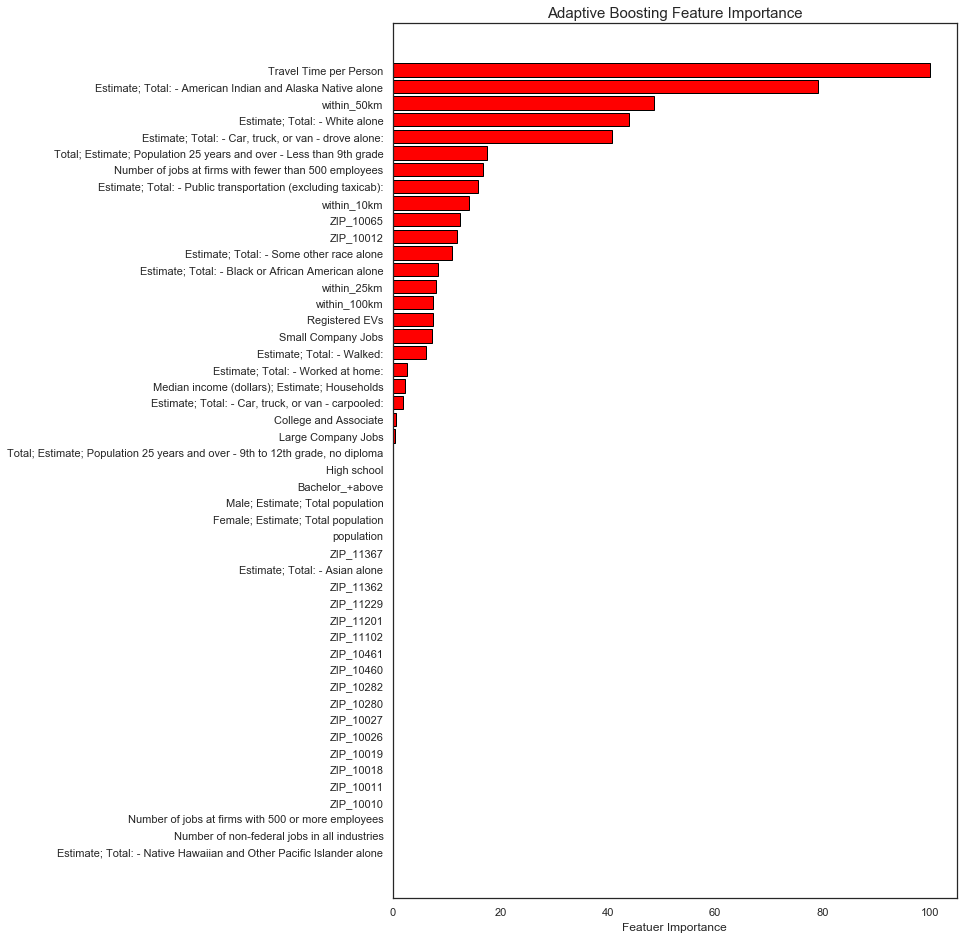

In [1250]:
feature_importance = ada_tree.feature_importances_
#relative feature importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
ada_feat = pd.DataFrame({'feature':X_train.columns, 'importance':feature_importance})

ada_feat = ada_feat.sort_values(by='importance', ascending=True)

plt.figure(figsize=(9, 15))
plt.barh(width=ada_feat.importance, y=ada_feat.feature,color='red',edgecolor = 'black');

plt.ylabel(''); plt.xlabel('Featuer Importance'); plt.title('Adaptive Boosting Feature Importance',size=15)

### 5.1 Gradient Boosting Regressor

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html

In [980]:
from sklearn.ensemble import GradientBoostingRegressor

gb_tree = GradientBoostingRegressor()
gb_tree.fit(X_train, y_train)

gb_train_score = gb_tree.score(X_train, y_train)
gb_val_score = gb_tree.score(X_val, y_val)

print('Train Score: ', gb_train_score)
print('Validation Score: ', gb_val_score)

Train Score:  0.9073978682204412
Validation Score:  0.6566987077863289


#### 5.1.2 Cross-Validation

In [899]:
gb_tree.get_params()

{'alpha': 0.9,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 1,
 'loss': 'ls',
 'max_depth': 9,
 'max_features': 4,
 'max_leaf_nodes': 16,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 37,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'presort': 'auto',
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [983]:
%%time

param_dist = {'max_depth': randint(1, 15),
              'max_features': randint(2, 30),
              'max_leaf_nodes': randint(3, 100),
              'min_samples_leaf': randint(1, 40),
              'min_samples_split': randint(2,10),
             'n_estimators': randint(1,100),
             'loss':['ls', 'lad', 'huber', 'quantile']}

rnd_gb_search = RandomizedSearchCV(gb_tree, param_distributions=param_dist, 
                                cv=5, n_iter=150,random_state=1)

rnd_gb_search.fit(X_train, y_train)

print(rnd_gb_search.best_params_)

{'loss': 'ls', 'max_depth': 11, 'max_features': 12, 'max_leaf_nodes': 15, 'min_samples_leaf': 19, 'min_samples_split': 8, 'n_estimators': 60}
Wall time: 1min 4s


In [984]:
gb_tree.set_params(loss='ls', max_depth=9, max_features=12, max_leaf_nodes=15, 
                   min_samples_leaf=19,min_samples_split=8,n_estimators=60)
gb_tree.fit(X_train, y_train)

print('Train Score: ', gb_tree.score(X_train, y_train))
print('Validation Score: ', gb_tree.score(X_val, y_val))

Train Score:  0.8298789604095272
Validation Score:  0.6445125525399675


In [985]:
y_pred_gb = gb_tree.predict(X_test)
gb_mse = mean_squared_error(y_pred_gb, y_test.values.ravel())
gb_rmse= np.sqrt(gb_mse)

print("Test MSE with Cross-Validated Bagging:", gb_mse)
print("Test RMSE with Cross-Validated Bagging", gb_rmse)

Test MSE with Cross-Validated Bagging: 20767.148389176196
Test RMSE with Cross-Validated Bagging 144.10811354388133


Text(0.5, 1.0, 'Gradient Boosting Tree Feature Importance')

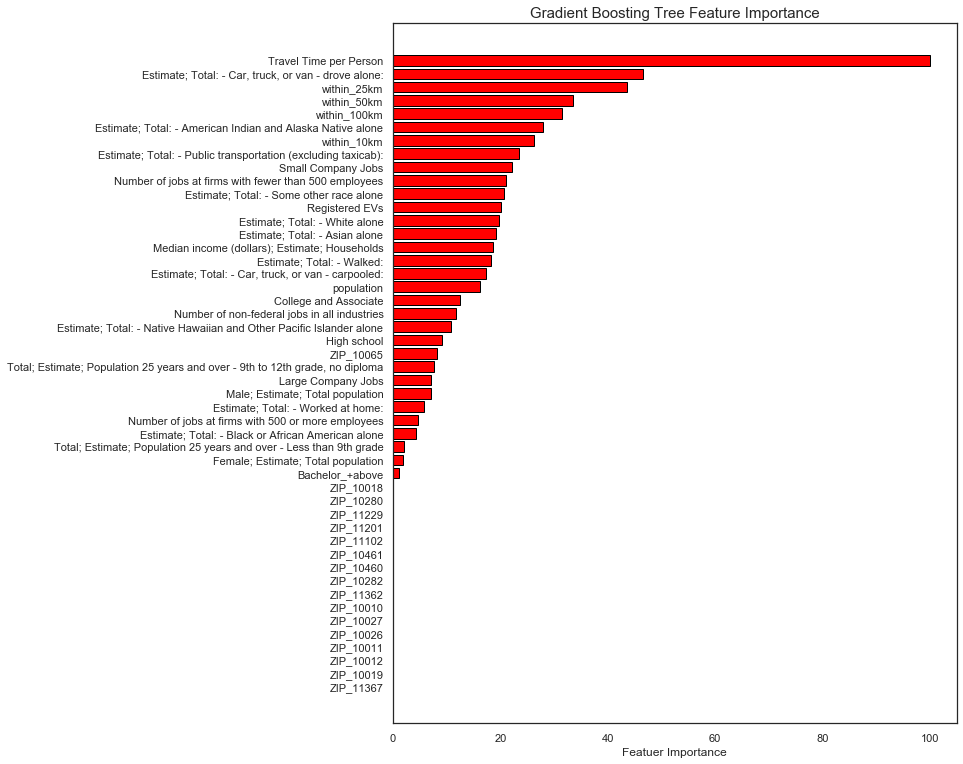

In [1249]:
feature_importance = gb_tree.feature_importances_
#relative feature importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
gb_feat = pd.DataFrame({'feature':X_train.columns, 'importance':feature_importance})

gb_feat = gb_feat.sort_values(by='importance', ascending=True)

plt.figure(figsize=(9, 12))
plt.barh(width=gb_feat.importance, y=gb_feat.feature,color='red',edgecolor = 'black');

plt.ylabel(''); plt.xlabel('Featuer Importance'); plt.title('Gradient Boosting Tree Feature Importance',size=15)


## Evaluation of Models

Brief summary of evaluated models are as follows: 

**linear_model1:** Linear Regression Model fitted before zipcode variable included. Backward Elimination is used for feature selection. <br>
**linear_model2:** Linear Regression Model fitted before zipcode variable included. Recursive Feature Elimination is used for feature selection. <br>
**ridgecv1:** Cross Validated Ridge Regression Model fitted without zipcode dummy variables.<br>
**lassocv1:** Cross Validated Lasso Regression Model fitted without zipcode dummy variables <br>
**linear_model3:** Linear Regression Model fitted including the zipcode dummy variable. Backward Elimination is used for feature selection. <br>
**linear_model4:** Linear Regression Model fitted including the zipcode dummy variable. Recursive Feature Elimination is used for feature selection. <br>
**ridgecv2:** Cross Validated Ridge Regression Model fitted including the zipcode dummy variables. <br>
**lassocv2:** Cross Validated Lasso Regression Model fitted including the zipcode dummy variables.<br>
**rf_tree:** Random Forest Regression Model with all variables. RandomizedSearchCV is used for cross validation. <br>
**bag_tree:** Bagged Tree Regression Model with all variables. RandomizedSearchCV is used for cross validation. <br>
**ada_tree:** Adaptive Boosting Tree Regression Model with all variables. RandomizedSearchCV is used for cross validation. <br>
**gb_tree:** Gradient Boosting Tree Regression Model with all variables. RandomizedSearchCV is used for cross validation. <br>

#### Base Model For Comparison
As a basemodel I choose y_hat = y_mean. Which is the mean monthly consumption of all evaluated chargers. 
I will find the MSE from that model and set it as a baseline mode.

In [1291]:

y_mean = y.values.ravel().mean()
y_pred_mean = [y_mean] * len(y_test)
base_mse = mean_squared_error(y_pred_mean, y_test.values.ravel())
base_rmse= np.sqrt(base_mse)

base_rmse

250.1716797184969

<Figure size 1440x720 with 0 Axes>

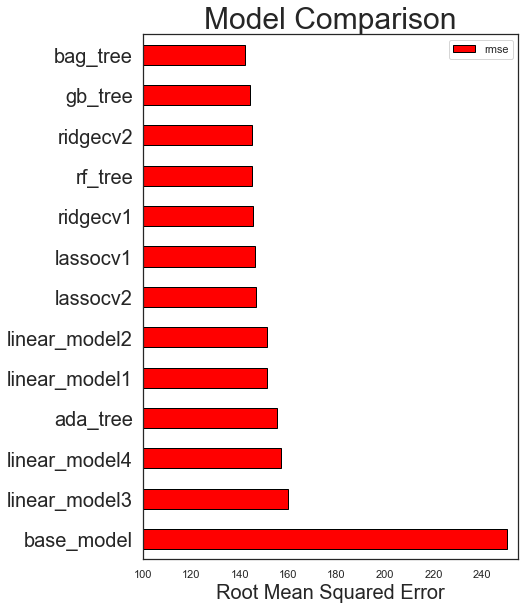

In [1292]:
# Dataframe to hold the results
plt.figure(figsize=(20,10))
model_comparison = pd.DataFrame({'model': ['linear_model1','linear_model2','linear_model3','linear_model4',
                                           'ridgecv1','ridgecv2','lassocv1','lassocv2','rf_tree','bag_tree',
                                          'ada_tree','gb_tree','base_model'],
                                 'rmse': [linear_model1_rmse,linear_model2_rmse,linear_model3_rmse,linear_model4_rmse,
                                           ridgecv1_rmse,ridgecv2_rmse,lassocv1_rmse,lassocv2_rmse,rf_rmse,bag_rmse,
                                          ada_rmse,gb_rmse,base_rmse]})

# Horizontal bar chart of test mae
model_comparison.sort_values('rmse', ascending = False).plot(x = 'model', y = 'rmse', kind = 'barh',
                                                           color = 'red', edgecolor = 'black')

# Plot formatting
plt.ylabel(''); plt.xlabel('Root Mean Squared Error',size=20); plt.title('Model Comparison',size=30); plt.yticks(size=20)
plt.xlim([100,255])
plt.show()



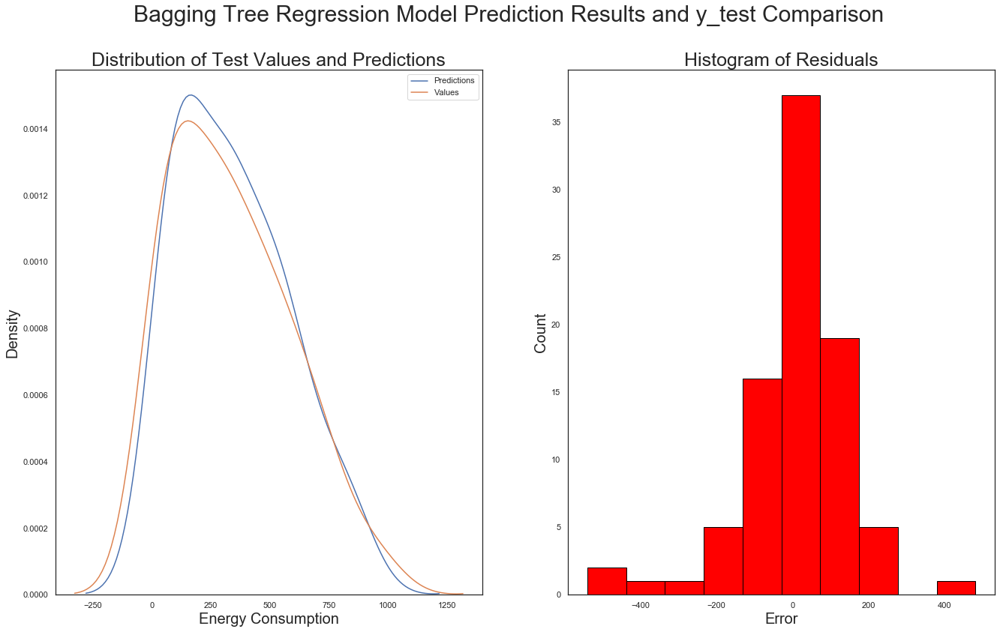

In [1236]:
fig, axes = plt.subplots(1,2, figsize=(20,12))
    
fig.suptitle('Bagging Tree Regression Model Prediction Results and y_test Comparison',size = 30)

ax1=axes[0]
ax2=axes[1]
# Density plot of the final predictions and the test values
sns.kdeplot(y_pred_bag, label = 'Predictions',ax=ax1)
sns.kdeplot(y_test.values.ravel(), label = 'Values',ax=ax1)

# # Label the plot
ax1.set_xlabel('Energy Consumption',size=20)
ax1.set_ylabel('Density',size=20)
ax1.set_title('Distribution of Test Values and Predictions',size=25)


# Calculate the residuals 
residuals = y_pred_bag- y_test.values.ravel()

# Plot the residuals in a histogram
ax2.hist(residuals, color = 'red', bins = 10,
         edgecolor = 'black')
ax2.set_xlabel('Error',size=20); plt.ylabel('Count',size=20)
ax2.set_title('Histogram of Residuals',size=25);

#### 1.6 Prediction Results 

The initial results suggests that using the given feature matrix, the predictive power of the model is very low. Ridge and Lasso regression is first performed using ZIP Code Dummy Variable. However, the fact that Lasso Model eliminating this parametets motivated me to form new models without using these parameters. Therefore, I completed my analysis with 2 Ridge and 2 Lasso Models.

For the first Ridge Regression, the cross validation process suggested using regularizatin parameter alpha = 20000 Using this alpha value, we get a test MSE with cross-validated ridge as 60032.6699 , which is high above the mean energy consumption for the given zipcoes. 

For the first Lasso Regression Model, the cross validation process suggested using regularizatin parameter alpha = 300. Using this alpha value, we get a test MSE with cross-validated lasso as 45706.91922048834 and RMSE of 1228.1401932499869, which is again high above the mean energy consumption for the given zipcoes. The optimal Lasso regularization of 0, drived many parameters to zero. The initial parameters implemented in the model can be seen in the Lasso_Coefficient dataframe above. This refutes the initial hypothesis of ZIP Code dummy variables will be impactful in the model.  

After dropping the ZIP Code dummy variables in the second Ridge Regression Model,  the cross validation process suggested using regularizatin parameter alpha = 3819.095477386935. Using this alpha value, we get a test MSE with cross-validated ridge as 57145.11852127125, This indicates an improvement in the model performance however it is still very higher than the required value to deem the model as successfull. 

The second Lasso Model on the other hand performed worst than the first one after dropping variables. The cross validation process suggested using regularizatin parameter alpha = 0.001. Using this alpha value, we get a test MSE with cross-validated lasso as 66314.77454502205. Since this value is at the border of my defined range, I tried lower values but this did not change the MSE. Therefore, I settled at this alpha value. With the optimal alpha value, non of the parameters are driven to zero. 

Among the evaluated models, Lasso Regression Model with ZIP Code dummy variable performed the best with a MSE of 56412.96172021413. This is an extremely high value considering the mean energy consumption of New York City which equals to 229.9055154361422 kWh per month among all ZIP Codes. 


## DECISION TREE BASED MODELS 

https://towardsdatascience.com/understanding-decision-trees-for-classification-python-9663d683c952?

## Interpretation and Conclusions 

We tried to tackle the EV Charger Energy Demand Prediction Questions using 3 different approaches to solve the EV Charger resource allocation problem for governments and utility companies. The first model is based on predicting the exact energy demand per month in New York City using Ridge and Lasso Models. In the third model, we increased the spatial coverage of the model and in order to capture the variance between different areas we used completely urban, very urban, urban, completely rural, very rural and rural classifications assigned by US Census Data. In the final model, we focused on quantifying the impact of EV Charging on the grid by predicting the overall energy consumption induced by EV Charging in the future. 

#### Interpretation and Conclusion for New York City Monthly EV Charger Energy Consumption 

The New York City Monthly EV Charger Energy Consumption model, aims to predict the future energy demand of EV chargers and decide whether to increase the number of ports at the given charger location. If the model predicts and energy consumption level above the existing capacity of the charger, the utility company can choose to increase the ports at that location. 

In order to answer the question of how much energy will be demanded in the future at a given zip code, 2 Ridge and 2 Lasso Models are utilized with different features. In the first set of Ridge and Lasso Models, ZIP Codes are also included as dummy variables. The idea behind inclusion of ZIP Codes as dummy variables was to be able to capture the variance between different ZIP Code characteristics that are not captured by our existing features. In the first set of models, Lasso Model performed better than Ridge Model, however both models remain low in predictive power. Due to the mechanism of the Lasso Model, several feature coefficients are driven to zero at the best performing model. Suprisingly, 'Number of Registrations' and all the ZIP Code dummy variables had zero coefficients. Which refutes the initial hypothesis of ZIP Code dummy variables will be impactful in the model. 'Number of Registrations' feature coefficient being zero, also suggests performing a better data engineering on this variable. We could have used aggregated 'Number of EV Registrations' or another indicator as a measure of number of EVs on the road. 

After this initial observations, the models are tailored and 'Number of Registrations' and 'ZIP Code Dummies' are dropped. Dropping 'Number of Registrations' worsen the model performance so I decided to drop ZIP Codes only. The new feature matrix improved the Ridge Regression model however the MSE of Lasso did not changed significantly. I was hoping to get a Ridge Model performance better than Lasso however that did not happen. In the second set of models, Ridge outperformed Lasso and the MSE dropped to 57145.118. 

Among the evaluated models, 2 nd Ridge Regression Model dropping the ZIP Code dummy variable performed the best with a MSE of 56412.96172021413 and RMSE of 1561.909903611257. This is an extremely high value considering the mean energy consumption of New York City which equals to 229.9055154361422 kWh per month among all ZIP Codes. Given the results even the best performing model is not suitable for future predictions But at least, the attempts to improve model performance resulted in success.

There could be several reasons behind this failure. We tried to improve our features by expanding the dataset, however features we used might have remained too general to predict such a complex variable as EV Charger Energy Consumption. I believe, If we had a data that captures travel behaviors, travel routes and location popularity we could have get better results. Altough we searched, we couldnt find business and employer related data for ZIP Codes. Which again is crucial to understand public charging choice of EV owners. In addition to the lack of features the existing features might be not improved sufficiently. I didn't tried non-linearizing the parameters due to dime contraints. Also, In the initial models, I didnt performed any kind of standardization. However, for the Ridge Model I should have done that to decrease the bias on the coefficients induced by the ridge model loss function.  



Resources: 
1. Attkisson, Sharyl (2012-06-02). "Electric vehicles fall drastically short of Obama's 1 million goal". CBS News. Retrieved 2012-06-12. 
2. (EIA)., U.E.I.A., 2013. International energy outlook 2016 with projections to 2040.https://www.eia.gov/outlooks/ieo/pdf/0484(2016).pdf 
3. New York State Energy and Research and Development Authority, 2019. Electric Vehicle Programs. https://www.nyserda.ny.gov/Researchers-and-Policymakers/Electric-Vehicles/Electric-Vehicle-Programs 
4. Richardson, D., 2013. Electric vehicles and the electric grid: A review of modeling approaches, Impacts, and renewable energy integration. Renewable and Sustainable Energy Reviews, 19, 247-254. (Richardson, 2013; Galus et al., 2010; Lund and Kempton, 2008) http://evtc.fsec.ucf.edu/publications/documents/HNEI-04-15.pdf. 
